# Bicycling in Copenhagen

*02806 Social Data Analysis and Visualization <br>
Department of Applied Mathematics and Computer Science - Technical University of Denmark (DTU) <br>
May 10, 2022*

Group members:
* Casper Lind Larsen, s175138
* Jakub Peplinski, s175137
* William Lindgreen, s175141

The following explainer notebook describes the dataset, the data analysis, visualizations, methodology and much more for bicycle patterns in Copenhagen. The associated website can be found here: [BicyclingInCopenhagen](https://wlindgreen.github.io/BicyclingInCopenhagen/)

--- 
# Table of Contents

* [1. Motivation](#sec1)
* [2. Basic Stats](#sec2)
* [3. Data Analysis](#sec3)
    * [3.1 Bicycle Patterns](#sec3_1)
    * [3.2 Effects of Bicycle Infrastructure Expansions](#sec3_2)
    * [3.3 Comparison of Bicycle and Car Trends](#sec3_3)
    * [3.4 The Influence of Weather](#sec3_4)
    * [3.5 Predicting Bicycle Counts](#sec3_5)
* [4. Genre](#sec4)
* [5. Visualizations](#sec5)
* [6. Discussion](#sec6)
* [7. Statement of Contributions](#sec7)
* [8. References](#sec8)


---
# 1. Motivation <a class="anchor" id="sec1"></a>

**Introduction** <br>
This study deals with bicycle patterns in Copenhagen. A city that is world-famous for its bicycle infrastructure and large numbers of cyclists on the bike paths, which makes it one of the world’s most bicycle-friendly and developed in the world ([Haqqi, 2021](https://www.money.co.uk/credit-cards/cycle-cities)). In a world where almost every country is trying to become more sustainable and where cities are becoming denser than ever before, bikes play a huge role in succeeding. From a sustainable transportation view, moving travellers to bikes plays a similar role to improving public transportation and removing cars from the streets. Therefore, analysing bicycle patterns, trends and development is the key and necessary to make the city even more sustainable and create a greener and brighter future for generations to come. Promoting and improving cycling has been a priority in Denmark for decades and has made them a pioneering country within that area, with Copenhagen being the flagship of that project. This makes Copenhagen especially interesting to research and creates an opportunity to find answers to, what leads to more cycling and which patterns are standing out. 
The research group consists of students from the transportation study line with deep connections and knowledge of Copenhagen, which makes this project extra exciting and provides a personal angle and curiosity to the study. 

**Dataset** <br>
The dataset used in the study contains bicycle counts from 13 different locations around Copenhagen collected between 2005 and 2014. The data was collected by the Copenhagen Municipality and is the only dataset of this kind publicly available, which is the reason why the last year is full 8 years back from the present. The dataset is distributed over a file for each year, where each file contains the exact place of the counting with coordinates, the direction, date and the count divided into one-hour intervals. The exact method of collection is not stated, but Copenhagen Municipality is known for using censors, pressure hoses and manual counting. More details about the dataset will be provided in the next section.

**Objective** <br>
The study aims to create a broader perspective and view of how Copenhageners use the bicycle paths by looking into the bicycle patterns. It will look deeper into the possible aspects that may affect the patterns such as infrastructure expansion and the weather. Moreover, the study strives to predict the bicycle counts for the future. The study aims to answer the following questions:

- How do you avoid the rush hour on the bike paths?
- In which season and months are cycling most popular?
- What effect do the so-called cycle superhighways have on the bicycle demand on a route?
- Does the weather affect Copenhageners’ cycling habits and does the petrol price have an effect?
- How much pressure on the bike paths can be expected in the future?

The analysis of the bicycle patterns can be utilized both for citizens in Copenhagen to get insights into the bicycling behaviour, but maybe more importantly for decision-makers and traffic planners in order to optimize and improve the infrastructure of cyclists in Copenhagen. If the project provides insights or predictions that can be used to a certain extent for future bicycle initiatives, the authors are satisfied with the project.

---
# 2. Basic stats <a class="anchor" id="sec2"></a>

Before proceeding with the real analysis some data cleansing and preprocessing is done. First of all necessary packages are loaded and some configurations are done.

Besides the packages used in the course the following packages are neccesary to run the Notebook.

In [81]:
# Install packages
# conda install -c conda-forge pyproj
# conda install -c conda-forge statsmodels
# conda install -c anaconda xlrd

In [82]:
# Load packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import calendar
import os
import requests
from xml.etree import ElementTree
import folium 
from folium import plugins
from folium.plugins import TimestampedGeoJson
import pyproj
import seaborn as sns

# Bokeh imports
from bokeh.plotting import figure, output_file, show, reset_output, save
from bokeh.models import *
from bokeh.io import output_notebook
from bokeh.palettes import *
from bokeh.transform import factor_cmap
from bokeh.models.widgets import Panel, Tabs
from bokeh.resources import INLINE

# Machine learning
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import mean_squared_error, accuracy_score, recall_score, precision_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score 
import statsmodels.api as sm

# This line of code is added in the end of the process after the warnings have been double-checked
import warnings
warnings.filterwarnings("ignore")

# Recurring attributes for plots
%config InlineBackend.figure_format = 'retina' # Increase the resolution / quality for plots with 'retina'
pd.options.mode.chained_assignment = None
plt.rcParams.update({'font.size': 12}) # Font size for plots
plt.rcParams["axes.labelweight"] = "bold" # Axes labels bold text

# Ensure that the Bokeh output is visualized in Jupyter.
reset_output()
output_notebook(INLINE)


Loading BokehJS ...

The primary data used in the study is bicycle counts from around Copenhagen. The data is gathered from 2005 till 2014 at several different locations. There are no bicycle counts available after 2014. The data is retrived from the following page: [Opendata.dk](https://www.opendata.dk/city-of-copenhagen/faste-cykeltaellinger).

In [83]:
# Load bicycle count data
cwd = os.path.abspath('')
files = os.listdir(os.path.join(cwd, "Data"))
df = pd.DataFrame()
for file in files:
    if file.startswith('cykeltaellinger'):
        df = df.append(pd.read_excel(os.path.join(cwd, "Data", file), skiprows = list(range(10))), ignore_index = True)

# Rename columns
df.rename(columns = {'Vej-Id':'ID', 'Vejnavn':'Location', 'Spor':'Lane', 'Dato':'Date'}, inplace = True)

To get a quick overview of what type of data is being used a quick look can be taken at the first rows.

In [84]:
df.head()

,ID,Location,Lane,(UTM32),(UTM32).1,Date,kl.00-01,kl.01-02,kl.02-03,kl.03-04,kl.04-05,kl.05-06,kl.06-07,kl.07-08,kl.08-09,kl.09-10,kl.10-11,kl.11-12,kl.12-13,kl.13-14,kl.14-15,kl.15-16,kl.16-17,kl.17-18,kl.18-19,kl.19-20,kl.20-21,kl.21-22,kl.22-23,kl.23-24
0,101 1011492-0 1/ 1 -,Ellebjergvej,NaN,720887,6172775,01.01.2014,5.0,3.0,2.0,6.0,2.0,5.0,3.0,0.0,3.0,2.0,2.0,8.0,5.0,15.0,3.0,5.0,13.0,1.0,0.0,3.0,3.0,2.0,0.0,2.0
1,101 1011492-0 1/ 1 -,Ellebjergvej,NaN,720887,6172775,02.01.2014,1.0,1.0,1.0,0.0,2.0,1.0,8.0,7.0,8.0,8.0,13.0,10.0,20.0,17.0,13.0,10.0,17.0,14.0,3.0,4.0,9.0,3.0,1.0,1.0
2,101 1011492-0 1/ 1 -,Ellebjergvej,NaN,720887,6172775,03.01.2014,0.0,0.0,0.0,3.0,2.0,5.0,15.0,12.0,16.0,24.0,41.0,10.0,15.0,12.0,30.0,8.0,11.0,4.0,5.0,6.0,2.0,6.0,0.0,2.0
3,101 1011492-0 1/ 1 -,Ellebjergvej,NaN,720887,6172775,04.01.2014,1.0,1.0,1.0,0.0,0.0,1.0,2.0,2.0,7.0,5.0,12.0,12.0,18.0,9.0,12.0,14.0,8.0,4.0,5.0,3.0,2.0,1.0,3.0,3.0
4,101 1011492-0 1/ 1 -,Ellebjergvej,NaN,720887,6172775,05.01.2014,0.0,1.0,2.0,0.0,2.0,1.0,0.0,11.0,9.0,9.0,2.0,24.0,10.0,13.0,5.0,10.0,3.0,12.0,7.0,3.0,5.0,3.0,4.0,1.0


As it is seen from the above the data consist of some location names, location coordinates, dates and most importantly some hourly bicycle counts. It can already now be seen that the dataset include some missing values why some data cleaning has to be done.

If there are any duplicates rows in the data these would have to be removed. It is therefore checked if this is the case

In [85]:
# Check for duplicates
print("There are", df.duplicated().sum(), "duplicated rows in the dataset.")

There are 0 duplicated rows in the dataset.


As the data does not contain any dublicated rows, the next step is the data processing.

**Add relevant columns that will be used later** <br>
The ID includes either +, - or T at the end to indicate whether the trafic goes with the mileage direction, moves against it or if it is the total bicycle count at the location, respectively. At one of the locations, Dronning Louises Bro, traffic is only counted in one direction (out of the city center), but it is counted for three lanes as the bike lane is very wide. An example of 5 random samples from Dronning Louises Bro is shown below.

In [86]:
# Shorten name of cells with Dr. Louises Bro
df = df.replace('Dr. Louises Bro ( ml. Nørrebrogade og Frederiksborggade)', 'Dr. Louises Bro')

# Show sample
df[['ID', 'Location']][df.Location == 'Dr. Louises Bro'].sample(5, random_state = 5)

,ID,Location
21145,101 1011358-0 0/ 15 +2,Dr. Louises Bro
65410,101 1011358-0 0/ 15 +2,Dr. Louises Bro
75801,101 1011358-0 0/ 15 T,Dr. Louises Bro
65124,101 1011358-0 0/ 15 +1,Dr. Louises Bro
75664,101 1011358-0 0/ 15 +3,Dr. Louises Bro


The above segment shows was is stated above: There are no counting towards the city center (no '-' signs). Using data that only contains one way counts will result in misleading interpretation, therefore the counting station Dr. Louises Bro is excluded for some of the plots in the analysis later on.

A new coumn including the biking direction is added to the dataframe. As the lane number is included in the ID there is no need to keep the lane number column and it is therefore removed.

In [87]:
# Add column with direction
df.insert(loc = 2, column = 'Direction', value = df.ID.str[-1:])
    
# Remove the lane column
df.drop('Lane', axis = 1, inplace = True)

The columns with the hourly countings are renamed and the total daily number of bicycles at each location is added to the dataframe.

In [88]:
# Change column names for hourly counts
df.columns = df.columns.str.replace('kl.', '', regex = True)

# Add total daily bicycle count
col_hour = list(df.columns[6:30])
df.insert(loc = 30, column = "Daily", value = df[col_hour].sum(axis = 1))

Based on the 'Date' column, other columns are added to the dataset, as they will be utilized to show patterns in the data. For example, a new column that represents whether the bicycle count was done on a weekday or in the weekend is deduced and added to the dataframe.
The following columns are added:
* Year
* Month
* Day of week 
* Weekday/weekend
* Day of year

In [89]:
# New columns
df['Date'] = pd.to_datetime(df['Date'], format = "%d.%m.%Y")
df['Year'] = pd.DatetimeIndex(df['Date']).year
df['Month'] = pd.DatetimeIndex(df['Date']).month_name()
df['DayOfWeek'] = pd.DatetimeIndex(df['Date']).dayofweek # 0 Represents monday and 6 Sunday
df['DayOfWeek_str'] = pd.DatetimeIndex(df['Date']).day_name()
df['Weekday_Weekend'] = ['Weekday' if x < 5 else 'Weekend' for x in df['DayOfWeek']]
df['DayOfYear'] = pd.DatetimeIndex(df['Date']).dayofyear  # Returns 1 for January 1st and so on

A part of the study seeks to determine the influence of gasoline prices on the amount of bicycles. Therefore, a supplementary dataset including monthly petrol prices with the price being the one on the last day of the month is used. The prices are converted to net present values to account for inflation. The data is retrieved from Drivkraft Danmark's webpage ([Drivkraft Danmark, 2022](https://www.drivkraftdanmark.dk/priser/benzin/)).

In [90]:
# Load datasheet with monthly petrol prices
petrolPrices = pd.read_excel("Data/Benzinpriser.xlsx")

# Convert month number to name
petrolPrices['MÅNED'] = pd.to_datetime(petrolPrices['MÅNED'], format = '%m').dt.month_name()

# Keep only columns 'ÅR', 'MÅNED' and 'FAST FORBRUGERPRIS'
petrolPrices = petrolPrices[['ÅR', 'MÅNED', 'FAST FORBRUGERPRIS']]

# Rename columns
petrolPrices.rename(columns = {'ÅR':'Year', 'MÅNED':'Month', 'FAST FORBRUGERPRIS':'PetrolPrice'}, inplace = True)

# Complement the bicycle count data with petrol prices
df = pd.merge(df, petrolPrices, left_on = ['Year', 'Month'], right_on = ['Year', 'Month'])

**Handling missing values** <br>
The column including lane data was previously removed as it included mostly null values while the lane number is also included in the ID in cases with more than one bicycle lane. Let us now check if any other null values are present in the dataset.

In [91]:
# Show all columns
pd.set_option('display.max_columns', None)

# Check for missing values
pd.DataFrame([np.any(df.isna().to_numpy(), axis = 0)], columns = df.columns)

,ID,Location,Direction,(UTM32),(UTM32).1,Date,00-01,01-02,02-03,03-04,04-05,05-06,06-07,07-08,08-09,09-10,10-11,11-12,12-13,13-14,14-15,15-16,16-17,17-18,18-19,19-20,20-21,21-22,22-23,23-24,Daily,Year,Month,DayOfWeek,DayOfWeek_str,Weekday_Weekend,DayOfYear,PetrolPrice
0,False,False,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,False,False,False,False,False,False


As it can be seen above all columns with hourly counts have null values. Further, it can be derived that no rows include only null values as the are no instances of null values in the daily counts column.

It can further be checked if any zeros are present in the dataset as follows.

In [92]:
# Show all columns
pd.set_option('display.max_columns', None)

# Check for zeros
print(pd.DataFrame([np.any(df.isin([0]).to_numpy(), axis = 0)], columns = df.columns))

# Get the count of Zeros in the 'Daily' column
countZero = (df['Daily'] == 0).sum()
print('Count of zeros in the Daily Column: ', countZero)

      ID  Location  Direction  (UTM32)  (UTM32).1   Date  00-01  01-02  02-03  \
0  False     False      False    False      False  False   True   True   True   

   03-04  04-05  05-06  06-07  07-08  08-09  09-10  10-11  11-12  12-13  \
0   True   True   True   True   True   True   True   True   True   True   

   13-14  14-15  15-16  16-17  17-18  18-19  19-20  20-21  21-22  22-23  \
0   True   True   True   True   True   True   True   True   True   True   

   23-24  Daily   Year  Month  DayOfWeek  DayOfWeek_str  Weekday_Weekend  \
0   True   True  False  False       True          False            False   

   DayOfYear  PetrolPrice  
0      False        False  
Count of zeros in the Daily Column:  3051


Once again it can be seen that zeros are present in all columns with hourly counts. This is not necessarily a problem as it makes sense that at some hours in the middle of the night zero bicycles pass the counting station. It is, however, a problem that there are rows with zeros in the 'Daily' column as it would be very unlikely that zero bicycles pass a counting station during a day in Copenhagen. The reason for this might be that the road was closed due to construction work, that the counting equipment was being replaced or repaired, or simply that the equipment was out of order on that day.

Now that missing values has been discovered in the dataset, the next step is tocheck how substantial the problem is by checking how many rows have missing values.

In [93]:
print("There are", len(df[np.any(df.iloc[:, 6:30].isna().to_numpy(), axis = 1)]), "rows out of the total", len(df), "rows that contains missing values")

There are 728 rows out of the total 92090 rows that contains missing values


In the following, it will be investigated whether the null and zero values are systematic or not as removing systematic nulls and zeros could potentially cause certain trends to be excluded. 

First, it is checked if the missing values are specific to a location.

In [94]:
# Check for null values at each location
df[np.any(df.isna().to_numpy(), axis = 1)].groupby(df['Location']).size()

Location
Dr. Louises Bro      50
Ellebjergvej         62
Englandsvej          29
Fredensbro           69
Frederikssundsvej    89
Hareskovvej          51
Jagtvej              32
Kalvebod Brygge      59
Roskildevej          53
Torvegade            49
Tuborgvej            54
Vigerslev Allé       65
Åboulevard           66
dtype: int64

From the above values it does not seem like that the missing values have a relation to a specific location as no location has values that are significantly higher than the rest. Therefore it is further investigated if there could be any other explanation. It is checked if the missing values are from a specific time period.

In [95]:
# Get the number of missing values
missing = df.iloc[:, 6:30].isna().sum()

# Calculate the percentage of missing values
missing_percent = df.iloc[:, 6:30].isna().sum() / len(df) * 100

# Make a table containing the number of missing values and the percentage
missing_table = pd.concat([missing, missing_percent], axis = 1).round(2)

# Rename columns
missing_table.columns = ['Missing values', '% of total values']

missing_table

,Missing values,% of total values
00-01,99,0.11
01-02,331,0.36
02-03,319,0.35
03-04,98,0.11
04-05,96,0.10
05-06,95,0.10
06-07,88,0.10
07-08,88,0.10
08-09,86,0.09
09-10,77,0.08


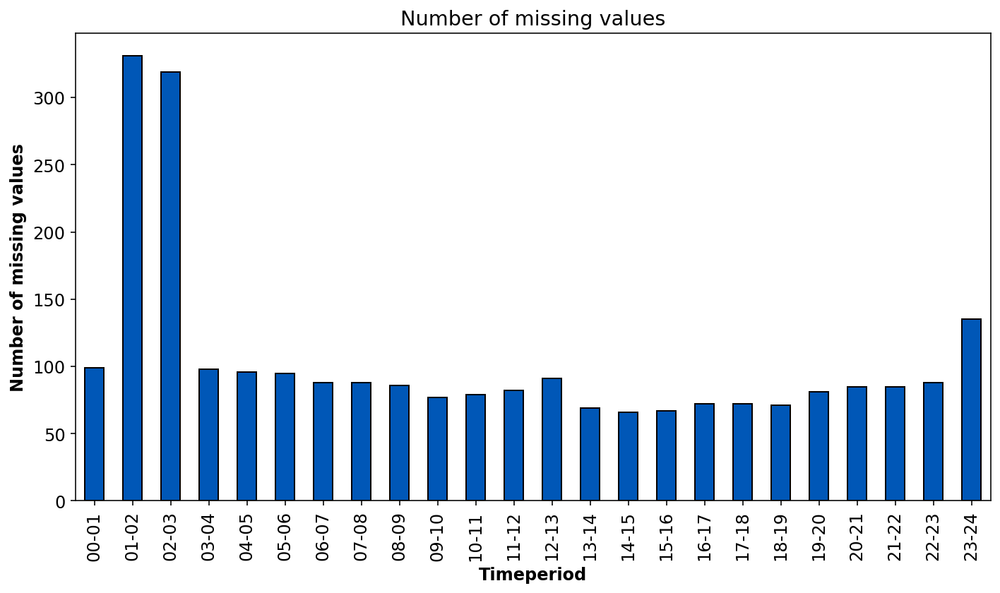

In [96]:
# Plot the missing values
missing_table['Missing values'].plot(kind = 'bar', grid = False, color = '#0057b7', edgecolor = 'black', figsize = (10,6))
plt.title("Number of missing values")
plt.xlabel("Timeperiod")
plt.ylabel("Number of missing values")
plt.show()

From the plot, it is obvious that two time periods act oddly compared to others, namely the hours 00-01 and 01-02. It is in the following further investigated what the reason for this could be. To dig deeper into this all days with NaN in either the column '01-02' or '02-03' are shown.

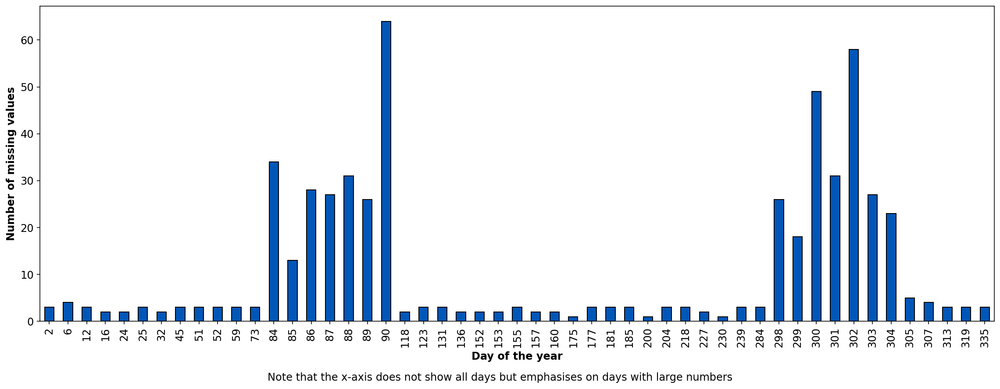

In [97]:
# New dataframe containing rows with missing values in the hours 01-02 or 02-03
null_values = df[df['01-02'].isnull() | df['02-03'].isnull()]

# Count the number of missing values per day
null_values_count = null_values['DayOfYear'].value_counts().sort_index()

# Plot the counts
null_values_count.plot(kind = 'bar', edgecolor = 'black', color = '#0057b7', figsize = (16,6))
plt.xlabel("Day of the year")
plt.ylabel("Number of missing values")
ftxt = "Note that the x-axis does not show all days but emphasises on days with large numbers"
plt.figtext(0.5, -0.02, ftxt, wrap = True, horizontalalignment = 'center', fontsize = 12)
plt.show()

When looking at the plot it is obvious that a large portion of the Nan values is in one of the last days of March (day 84-90) while some are one of the last days of October (day 298-304). The reason for this is that the clock is set one hour back or forward to correct for winter and summertime. There does not seem to be an explanation for the remainder of the missing values and it is therefore assumed that these are caused by failures in the counting mechanisms.

The way of handling the missing values and the days with a total count of zero will be to simply remove these rows from the dataset. In general, there are many ways of dealing with rows with missing values and probable flaws in rows with zero counts. These approaches include deleting the rows or columns and filling the values with e.g. the mean or median of the column. As the number of rows with missing values (728) and rows with days with a total count of zeros (3.051) constitutes a minor part of the data set, it is not considered to have any significance for the results to remove these rows ([Analytics Vidhya, 2021](https://www.analyticsvidhya.com/blog/2021/05/dealing-with-missing-values-in-python-a-complete-guide/)).

In [98]:
# Remove rows with NA
df = df.dropna(axis = 0)

# Remove rows with no bicycles counted
df = df[df.Daily != 0]

Besides the days where the are zero counts on a whole day there are also days with very little bicycles counted.

In [99]:
# Show all rows
pd.set_option('display.max_rows', None)

# Make dataframe sorted by total daily traffic count
sorted_daily = df.sort_values('Daily')

# Show first 20 rows
sorted_daily.head(20)

,ID,Location,Direction,(UTM32),(UTM32).1,Date,00-01,01-02,02-03,03-04,04-05,05-06,06-07,07-08,08-09,09-10,10-11,11-12,12-13,13-14,14-15,15-16,16-17,17-18,18-19,19-20,20-21,21-22,22-23,23-24,Daily,Year,Month,DayOfWeek,DayOfWeek_str,Weekday_Weekend,DayOfYear,PetrolPrice
4814,101 1011492-0 1/ 1 +,Ellebjergvej,+,720887,6172775,2014-08-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2014,August,4,Friday,Weekday,220,14.14
6076,101 1011492-0 1/ 1 +,Ellebjergvej,+,720887,6172775,2014-10-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2014,October,3,Thursday,Weekday,289,13.41
4173,101 1011492-0 1/ 1 +,Ellebjergvej,+,720887,6172775,2014-07-18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2014,July,4,Friday,Weekday,199,14.25
925,101 1011908-0 0/ 66 T,Fredensbro,T,724290,6177606,2014-02-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2014,February,3,Thursday,Weekday,37,14.10
4168,101 1011492-0 1/ 1 +,Ellebjergvej,+,720887,6172775,2014-07-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,2014,July,6,Sunday,Weekend,194,14.25
6037,101 1011492-0 1/ 1 -,Ellebjergvej,-,720887,6172775,2014-10-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2014,October,2,Wednesday,Weekday,281,13.41
4177,101 1011492-0 1/ 1 +,Ellebjergvej,+,720887,6172775,2014-07-22,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2014,July,1,Tuesday,Weekday,203,14.25
5486,101 1011492-0 1/ 1 +,Ellebjergvej,+,720887,6172775,2014-09-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2014,September,1,Tuesday,Weekday,273,13.97
897,101 1011908-0 0/ 66 +,Fredensbro,+,724290,6177606,2014-02-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2014,February,3,Thursday,Weekday,37,14.10
4811,101 1011492-0 1/ 1 +,Ellebjergvej,+,720887,6172775,2014-08-05,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2014,August,1,Tuesday,Weekday,217,14.14


<a name="section2"></a>
It can be seen from the above dataframe that on some days there are only very few bicycles counted. This could be true for some of the locations, but at e.g. Dronning Louises Bro where only two bicycles are counted on February 6. 2010 this is most likely a mistake. As some bicycles are counted these days the low number cannot be explained by a closed road or inactive measuring devices as it could with the days with zero bicycles counted. The rows are therefore left in the data even though some mistake in the data collecting has most likely happened.

**Outliers** <br>
One way to look for outliers is by using boxplots which will be done in the following. However, when working with traffic there are most likely alot of outliers that will show from the boxplot as events happening near the counting stations will drastically increase the bicycle count. These events could be football matches, concerts or similar events that attract a lot of people.

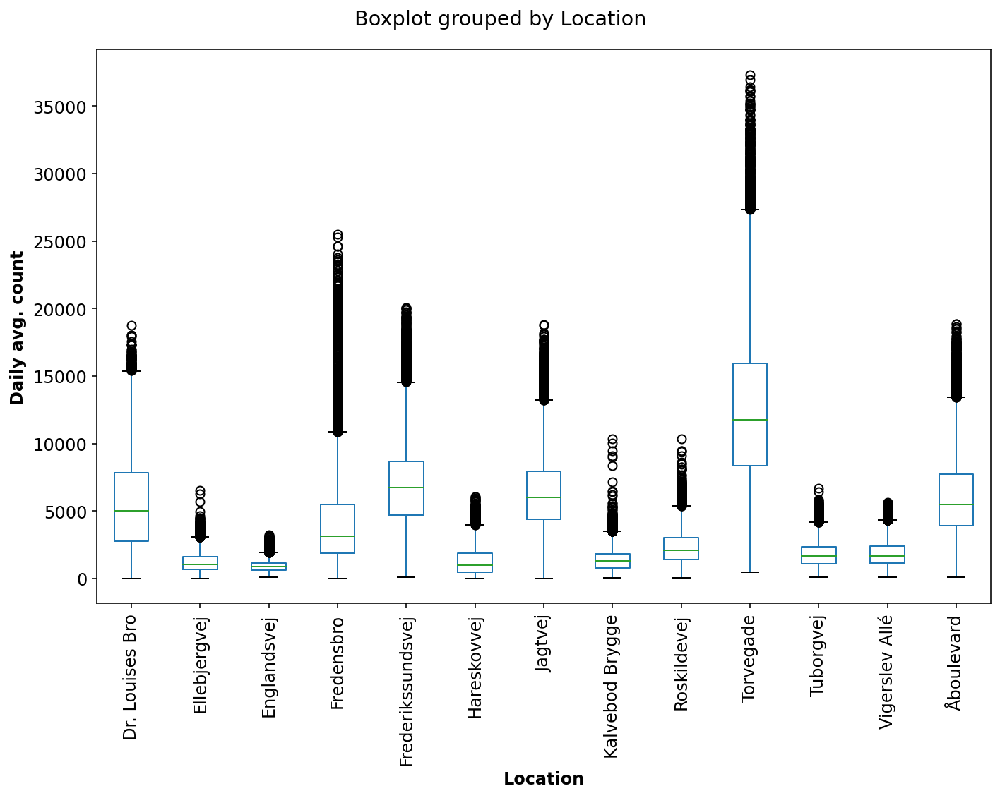

In [100]:
df.boxplot(by = 'Location', column = ['Daily'], grid = False, figsize = (10,8))
plt.xticks(rotation = 90);
plt.ylabel('Daily avg. count')
plt.title(None);
plt.show()

As it is seen from the boxplots there are outliers but these are most likely due to events at descibed above. They are therefore not mistakes and should not nessesarily be removed from the data. Some different metrics such as maximum, minimum and mean will be inspected to see if these seem to be reasonable and if the do then the outliers are not removed.

In [101]:
# Define numerical columns
numerical_columns = [col for col in df.columns if (df[col].dtype=='int64' or df[col].dtype=='float64') and col != '(UTM32)' and col != '(UTM32).1']

# Show metrics
pd.set_option('display.max_columns', None)
df[numerical_columns].describe().loc[['min','max', 'mean','50%'],:]

,00-01,01-02,02-03,03-04,04-05,05-06,06-07,07-08,08-09,09-10,10-11,11-12,12-13,13-14,14-15,15-16,16-17,17-18,18-19,19-20,20-21,21-22,22-23,23-24,Daily,Year,DayOfWeek,DayOfYear,PetrolPrice
min,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2005.000000,0.000000,1.0000,9.730000
max,1747.000000,1074.000000,1386.00000,2217.000000,2517.000000,2544.000000,2131.000000,3541.000000,4736.000000,4421.000000,3351.000000,3580.000000,2350.00000,2271.00000,3841.000000,3245.000000,4218.000000,3562.000000,2455.000000,2894.000000,2304.000000,1429.000000,4604.000000,1499.000000,37316.000000,2014.000000,6.000000,366.0000,15.420000
mean,57.147952,38.032445,29.48907,23.736316,21.970464,32.441307,96.870162,268.154902,381.208744,220.475507,167.134684,179.171657,198.98089,214.96443,263.008389,353.741546,402.534013,333.447081,245.278526,172.636365,131.186986,116.660557,104.808248,86.185401,4139.265643,2009.703599,2.983845,184.8998,13.257243
50%,21.000000,12.000000,8.00000,7.000000,9.000000,18.000000,60.000000,150.000000,186.000000,115.000000,86.000000,93.000000,107.00000,117.00000,151.000000,210.000000,234.000000,186.000000,125.000000,83.000000,61.000000,54.000000,48.000000,38.000000,2353.000000,2010.000000,3.000000,188.0000,13.230000


When first looking at the minimum hourly values in the above table it is seen that they are all zero. This makes sense as there has most likely been an hour in the night during the whole counting period where zero bicycles have passed by. There are no negative values or anything else odd. The minimum daily value is 1 which seems unlikely as it was also mentioned in the former.

The maximum hourly values range from 1074 as the lowest to 4736 as the highest. These values all seem reasonable. It would have been concerning if there were hours with tens of thousands counted bicycles within one hour. It is also seen from the maximum values that the highest ones are in the morning and afternoon rush hours while the lowest is in the night hours which makes good sense as well.

Taking a glance at the mean and median values there is nothing catching the eye as being unregular. Based on all this no outliers are removed from the dataframe.

**Other data manipulation** <br>
The GPS location from the counting stations is given in the standard coordinate system for Denmark, namely *'WGS 84 / UTM zone 32N'*. To visualize the counting stations and other geographical representations later on, the two columns are converted to latitude and longitude coordinates.

In [102]:
# Convert the UTM 32 projection coordinates to latitude and longitude coordinates with pyproj
P = pyproj.Proj(proj = 'utm', zone = 32, ellps = 'WGS84', preserve_units = True)
df["Longitude"], df["Latitude"] = P(df['(UTM32)'], df['(UTM32).1'], inverse = True)

# Remove old coordinate columns
df = df.drop(columns = ['(UTM32)', '(UTM32).1'])

The conversion above is tested by showing the GPS locations of the counting stations on a map. Firstly, a new dataframe is created with the unique locations of counting stations and their respective GPS coordinates. Subsequently, these locations are visualized on a Folium map. 

In [103]:
# New dataframe with unique location and coordinates
CS = df.drop_duplicates(subset = ["Location"])
CS = CS[["Location", "Longitude", "Latitude"]].reset_index(drop=True)

In [104]:
# Create Folium map with the GPS locations of the counting stations
CPH = folium.Map(location = [55.6761, 12.5683], zoom_start = 12, tiles = 'cartodbpositron')
CPH.add_child(plugins.Fullscreen()) # Add full screen button

# Loop over rows in the dataframe and plot each location labeled with counting station
for i in range(len(CS)):
    html = 'Location: {}'.format(CS.iloc[i]['Location'])
    iframe = folium.IFrame(html, width = 200, height = 40)
    popup = folium.Popup(iframe, max_width = 200)                                          
    folium.Marker(location = [CS.iloc[i]['Latitude'], CS.iloc[i]['Longitude']],
        icon = folium.Icon(color='orange', icon='bicycle', prefix='fa'),
        popup = popup).add_to(CPH) 
display(CPH)

By inspecting the map above, it can be inferred that all the markers are correctly located. It is difficult to assess whether the GPS locations are 100 % aligned with reality, but in general, the markers are placed at the road name they represent. Therefore, the conversion is deemed accomplished satisfactorily.

**Final Data** <br>
The datacleaning and preprossesing is now done, so let us get a look of overview of the final dataset. Firstly the dimensions of the dataset can be found.
<a name="finaldata"></a>

In [105]:
print("The number of columns is", df.shape[1], "and the number of rows is", df.shape[0])

The number of columns is 38 and the number of rows is 88333


After the data manipulation there is now 88.333 rows compared to 92.090 before. The data cleaning therefore includes removing 3.757 rows (4 %), which is deemmed being a small fraction.

To know exactly what locations where part of the countings each year a plot of this is produced below. The plot further shows how many days within each year that is counted in the final dataset.

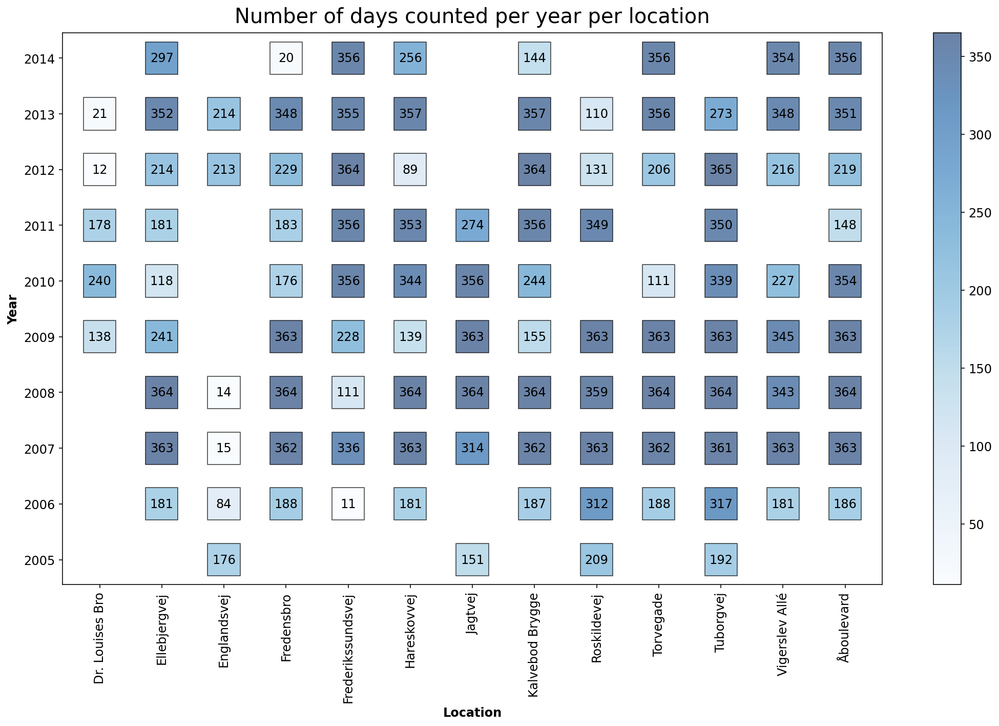

In [106]:
df_t = df.loc[df['Direction'] == 'T']
df_t = df_t.groupby(['Location','Year']).size().reset_index().rename(columns = {0:'Count'})
#
# Set the figure size
plt.rcParams["figure.figsize"] = [15, 10]
plt.rcParams["figure.autolayout"] = True

# Scatter plot
ax = df_t.plot.scatter(x = 'Location', y = 'Year',  s = 1000, alpha = 0.6, marker = 's', color = df_t.Count, cmap = 'Blues', sharex = False, edgecolors = 'black', grid = False)
plt.xticks(rotation = 90);
plt.yticks(np.arange(2005, 2015, 1))

# Display title
plt.title("Number of days counted per year per location", size = 20, pad = 10)

# Annotate each data point
for i, value in enumerate(df_t.Count):
    ax.annotate(value, (df_t.Location.iat[i], df_t.Year.iat[i]), ha = 'center', va = 'center')

plt.show()

As it can be derived from the plot above the data is not perfect at all. The number of locations counted is varying for each year with only four locations counted in 2005 as opposed to 12 locations counted in both 2008 and 2009. The year 2005 can be discussed to be less representative compared to the other years, which will be taken into account in some of the forthcoming sections. Also, the number of days counted within each year is varying a lot. However, the dataframe is still assessed to be satisfactory to proceed with as it still gives an overall indication of the bicycle patterns in Copenhagen.

To explore some of the knowledge gained before this study another plot is created to show the average daily count for each Sunday during the year separately and for each year during the data period. It is known that the second Sunday of June (week 23) is "The Great Bike Day", where Danes are encouraged to cycle ([Cyklistforbundet, 2022](https://www.cyklistforbundet.dk/om-os/det-laver-vi/store-cykeldag/)). The event is highlighted with red in the figure below to see if this Sunday differs from the rest.

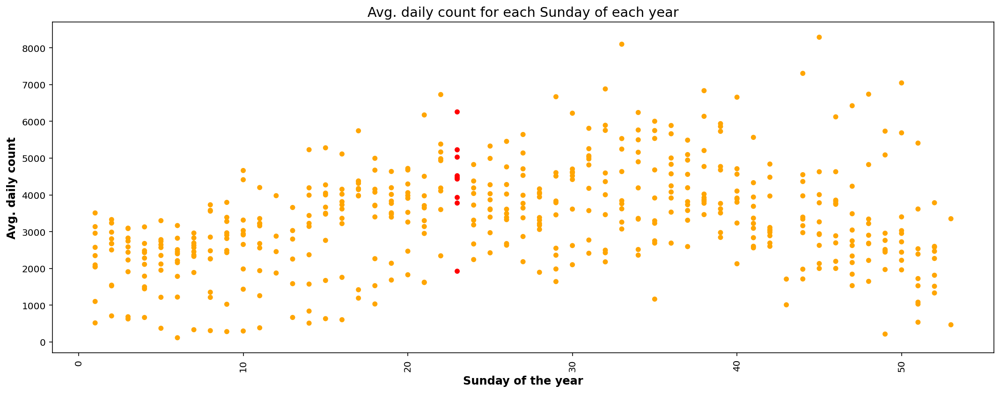

In [107]:
# Create df with sunday and find week number, and calculate avf. daily bicycle counts
dfsunday = df
dfsunday['WeekNo'] = dfsunday['Date'].dt.isocalendar().week
dfsunday = dfsunday[(dfsunday.DayOfWeek_str == "Sunday") & (df.Direction == "T")]
dfsunday = dfsunday.groupby(["WeekNo","Year"]).agg({"Daily": np.mean}).reset_index()

# Color week 23 and plot scatter
colors = ["red" if i == 23 else "orange" for i in dfsunday.WeekNo]
dfsunday.plot.scatter(x = "WeekNo", y = "Daily", legend = False, title = "Avg. daily count for each Sunday of each year",
    ylabel = "Avg. daily count", xlabel = "Sunday of the year", color = colors,
    rot = 90, figsize = (15, 6), fontsize = "10")
plt.show()

The figure above shows that based on the bicycle data from 2008 to 2014 in Copenhagen, there are not any clear connection or prove that people cycle more during "The Great Bike Day". However, it can be infeered that only two Sundays are counted in week 43 and four in week 12 during the 10-year period. This is due to the exclusion of the days where the time is changed as explained earlier.

---
# 3. Data Analysis <a class="anchor" id="sec3"></a>

In the following the conducted data analysis is presented. The section is divided into different parts, which all presents different interesting analyses regarding the bicycle counts in Copenhagen.

## 3.1 Bicycle patterns <a class="anchor" id="sec3_1"></a>

<a name="31"></a>
Every road user in Copenhagen might have a presumption of daily traffic patterns, no matter if you travel with car, bicycle or with a third mean of transport. Therefore, it would be interesting to investigate these travel patterns on a bicycle to see how one's assumption aligns with reality. For example, one would expect a higher percentage of bicycle usage in the warmer months compared to the colder months, or higher pressure on the bicycle paths in morning and afternoon peak hours than in the night hours. 

In the following section, the bicycle patterns in Copenhagen are analyzed with regard to different temporal patterns.

One important remark to make is that because the visualizations in the section contain values from 13 counting stations located on bicycle paths in completely different locations in Copenhagen, one should not pay too much attention to the actual numbers on the y-axis as. Instead, the interesting finding is the distribution throughout the day, week or year.

### 3.1.1 Daily Patterns

 *How does the cycling in Copenhagen change throughout the day?*

The above question will be sought answered by looking at the hourly bicycle counts from all counting stations. All years from 2005 till 2014 are included in the examination to get the most complete picture of the daily bicycle patterns. The results will therefore be expressed as average hourly bicycle counts from the whole time period as well as all the counting stations.

The counting station Dronning Louises Bro is excluded from the examination of hourly patterns as it will result in misleading interpretation as stated in [Section 2](#section2) as it only included one-way counts. Moreover, the total counts (both directions) will be the basis of the examination.

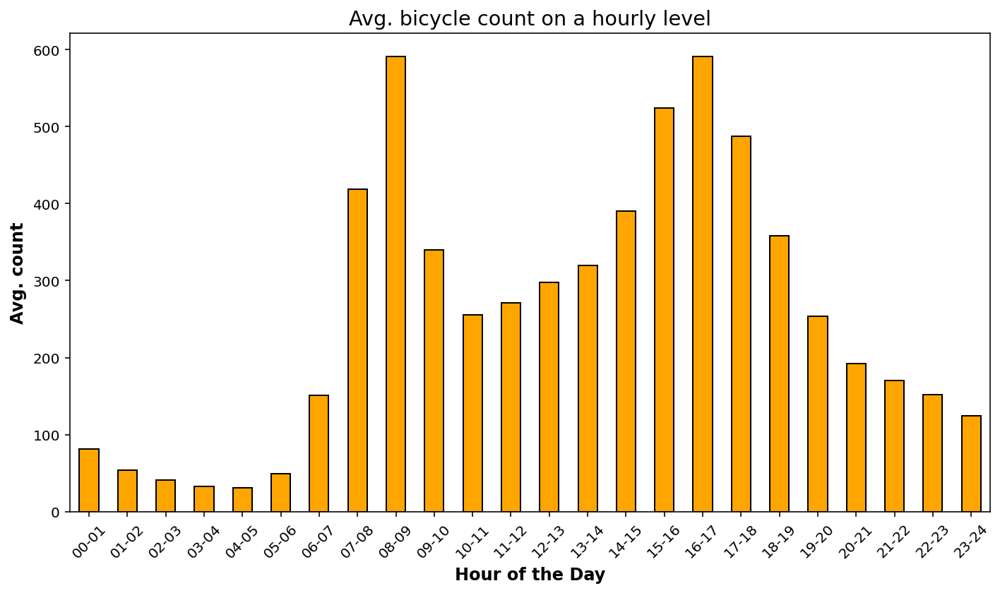

In [108]:
 # New Dataframe with avg. count each hour for all countings stations (except Dr. Louises Bro)
df_h = df[(df.Location != "Dr. Louises Bro") & (df.Direction == "T")]
df_h = pd.DataFrame(data = df_h.loc[:,'00-01':'23-24'].mean(), columns = ["Avg. cycle count"])

#Bar chart with the avg. cyclist count
df_h.plot(kind = "bar", legend = False, title = "Avg. bicycle count on a hourly level",
    ylabel = "Avg. count", xlabel = "Hour of the Day", color = 'orange', edgecolor = 'black',
    rot = 45, figsize = (10, 6), fontsize = "10")
plt.tight_layout()

It can be seen from the figure above that there are two periods of the day where the traffic counts are at the highest: A morning peak hour between 7 and 9 and an afternoon peak hour between 15 and 18. The lowest average counts are at night as expected.  

As it was expected that the daily bicycle patterns differ between weekdays and weekends, two new datasets have been created to find how big of a difference can be seen between a normal weekday and a normal weekend. Below an interactive line plot has been created, which enables the user to see the average traffic counts by hovering over the 24 hours for both an average weekday and weekend.

In [109]:
# Create a dataframes with Hour of the day on the x-axis and avg. cycle count on the on y-axis for weekend and weekday
df_h_weekday = df[(df.Location != "Dr. Louises Bro") & (df.Direction == "T") & (df.Weekday_Weekend == "Weekday")]
df_h_weekday = pd.DataFrame(data = df_h_weekday.loc[:,'00-01':'23-24'].mean(), columns = ["Avg_weekday"])
df_h_weekday["Pct"] = (df_h_weekday["Avg_weekday"] / np.sum(df_h_weekday["Avg_weekday"]))*100
df_h_weekend = df[(df.Location != "Dr. Louises Bro") & (df.Direction == "T") & (df.Weekday_Weekend == "Weekend")]
df_h_weekend = pd.DataFrame(data = df_h_weekend.loc[:,'00-01':'23-24'].mean(), columns = ["Avg_weekend"])
df_h_weekend["Pct"] = (df_h_weekend["Avg_weekend"]/np.sum(df_h_weekend["Avg_weekend"]))*100

# Merge and convert the dataframe into a Bokeh ColumnDataSource.
df_h_weekday_weekend = pd.merge(df_h_weekday, df_h_weekend, left_index=True, right_index=True).rename_axis('Hour').reset_index()
source_df = ColumnDataSource(data = df_h_weekday_weekend)

# Create df for hovering tool
df_h_weekday.columns = ["Avg", "Pct"]
df_h_weekend.columns = ["Avg", "Pct"]
hover = pd.concat([df_h_weekday, df_h_weekend], axis = 0).rename_axis('Hour').reset_index()
source_hover = ColumnDataSource(data = hover)

# Create a empty figure frame 'p'. x-range is set to deal with categorical values on the x-axis.
TOOLS = "pan, wheel_zoom, box_zoom, reset"
p = figure(width = 700, height = 500, title = "Avg. bicycle count on a hourly level, weekday/weekend", tools = TOOLS, 
           x_range = col_hour)

# Add the two lines for weekday and weekend
l1 = p.line(x = "Hour", y = "Avg_weekday", source = source_df, line_color = "orange", 
       legend_label = "Weekdays", line_width=3)
l2 = p.line(x = "Hour", y = "Avg_weekend", source = source_df, line_color = "#0057b7", 
       legend_label = "Weekends", line_width=3)

# Add circles for each hour
cr1 = p.circle(x = 'Hour', y = "Avg", source = source_hover, fill_color = "white", hover_fill_color = "red", 
             line_color = "black", alpha = 0.6, size = 8)

# Create a HoverTool object that shows thresholds values
p.add_tools(HoverTool(tooltips=[('Hour of the Day', '@Hour'), ('Avg. count', '@Avg{(0.)}'), 
                                ('Pct. of total avg. counts', '@Pct{(0.0)}')], renderers = [cr1]))

# Change labels etc.
p.title.align = "center"
p.title.text_font_size = '11pt'
p.legend.location = "top_left"
p.legend.click_policy= "mute"
p.xaxis.major_label_orientation = math.pi/4
p.xaxis.axis_label = 'Hour of the Day'
p.yaxis.axis_label = 'Avg. count'
p.yaxis.axis_label_text_font_style = 'bold'
p.xaxis.axis_label_text_font_style = 'bold'
p.toolbar.autohide = True
p.ygrid.grid_line_color = None
p.xgrid.grid_line_alpha = 0.8
p.xgrid.grid_line_dash = [8, 4]
p.y_range.start = 0
show(p)

<a name="311"></a>
It is clear that the average counts differ on a daily level for a weekday and the weekend. The two rush hour periods have become more extreme when only considering the weekdays. The counts are nearly the same between 11 and 14 for the two cases, in a time period where most of the Copenhageners are at work or in school. Furthermore, it can be derived that there are more bicyclists counted during the night hours at the weekend compared to a normal weekday. This could be explained by people being out for a longer time at the weekend, having a great time, partying or the like, as fewer people have errands or work in the morning. 

To conclude, the bicycle patterns are completely different when considering an average weekday or a day in the weekend. On a weekday there are two major morning and afternoon peaks, and at the weekend the demand is more spread out during the day. 

**Geographical representations of daily bicycle patterns**

In the figures above the bicycle counts have been visualized on an aggregated level for all the counting stations. To get a greater comprehension of where in Copenhagen there might be more and fewer bicyclists, the same average counts will be shown on a map during the day. For this visualization, all of the 13 counting stations are visualized on a map, including Dronning Louises Bro. Only the daily counts on a normal weekday are included in order to show how much the hourly counts can change throughout the day.
The inspiration and coding for the plot is taken from the the following page: ([Toro, 2019](https://www.linkedin.com/pulse/visualizing-nyc-bike-data-interactive-animated-maps-folium-toso/)). 

First a dataset that can be transformed to geojson features is created based on the dataframe with the bicycle counts.

In [110]:
# Create dataframe with only total traffic and weekdays as well as a empty df for loop
df_T_weekday = df[(df.Direction == "T") & (df.Weekday_Weekend == "Weekday")]
df_h_fol = pd.DataFrame()

# Loop over each unique location and calculate the avg. bicycle count for each hour.
for cs, long, lat in zip(CS.Location, CS.Longitude, CS.Latitude):
    d = pd.DataFrame(data = df_T_weekday[df_T_weekday.Location == cs].loc[:,'00-01':'23-24'].mean(), columns = ["Avg_count"])
    d['Location'] = cs
    d['Longitude'] = long
    d['Latitude'] = lat
    df_h_fol = pd.concat([df_h_fol, d], axis = 0)
df_h_fol = df_h_fol.rename_axis('Hour').reset_index()
df_h_fol["Hour"] = df_h_fol["Hour"].str[3:]

# Define the colors for the map depending on the counts
df_h_fol['Color'] = 'grey'
df_h_fol.loc[df_h_fol['Avg_count'] >= 100, 'Color'] = 'orange'
df_h_fol.loc[df_h_fol['Avg_count'] >= 200, 'Color'] = 'red'

The function below creates a geojson file based on the created dataframe. The radius is based on the counts, but as the difference between the smallest and largest value is huge, the radius will be square root transformed in order to get a more pleasant view on the map. This is because the square root transformation has the properties of even out the weight of very high values, just like a log transformation ([Choueiry, 2022](https://quantifyinghealth.com/square-root-transformation/)). 

In [111]:
# Define function that create folium points (inspiration form link above)
def create_geojson_features(df):
    features = []
    for _, row in df.iterrows():
        feature = {
            'type': 'Feature',
            'geometry': {
                'type':'Point', 
                'coordinates':[row['Longitude'],row['Latitude']]
            },
            'properties': {
                'time': pd.to_datetime(row['Hour'], unit = 'h').__str__(),
                'style': {'color' : ''},
                'icon': 'circle',
                'iconstyle':{
                    'fillColor': row['Color'],
                    'fillOpacity': 0.6,
                    'stroke': 'true',
                    'radius': np.sqrt(row['Avg_count']*0.5)
                }
            }
        }
        features.append(feature)
    return features

# Create geojson file on the dataset created with the above file
hourC_geojson = create_geojson_features(df_h_fol)

It is now possible to create a map that shows the hourly bicycle counts for each location in Copenhagen with the folium plugin: `TimestampedGeoJson`. Note that both the radius and the colouring aim to show the 'weight' of the bicycle counts. The avg. bicycle counts each hour are visualized with colours in the following way:
- <font color="grey"> Below 100 avg. hourly counts: *Grey*</font>
- <font color="Orange"> Between 100-200 avg. hourly counts: *Orange*</font>
- <font color="Red">Above 200 avg. hourly counts: *Red*</font>

<a name="map311"></a>

In [112]:
# Folium map of CPH showing the avg. bicycle counts each hour with the TimestampedGeoJson plugin
CPH = folium.Map(location = [55.6761, 12.5683], tiles = "CartoDB Positron", zoom_start = 12)
CPH.add_child(plugins.Fullscreen()) # Add full screen button

TimestampedGeoJson(hourC_geojson, period = 'PT1H', duration = 'PT1M', date_options = '[Hour of the day]: HH:mm',
                  transition_time = 500, auto_play = True, time_slider_drag_update = True).add_to(CPH)
CPH

The following can be observed from the map above:
* Torvegade at Christianshavn is the location with the most pressure on the bike paths both during the day and during peak hours.
* Even though there are only one-way counts at Dronning Louises Bro, it is still one of the locations with the most counted daily cyclist. This indicates that Dronning Lousies Bro is one of the busiest bike paths in Copenhagen.
* The average daily counts at the bike path locations in outer Copenhagen experience fewer cyclists, which is as expected. Though there are still relatively many cyclists during rush hour. 

*One note to make is that the authors would in fact have wanted to show how the traffic at the different locations changed in and out of the city during the day on a map like the one above with arrows, but unfortunately, it was a big challenge to make the code work.*

### 3.1.2 Weekly Patterns

*How does the cycling in Copenhagen change throughout the week?*

Besides exploring the daily patterns, the weekly bicycle patterns have also been investigated in order to answer the question above. Likewise, the following are based on the average bicycle countings for all the years.


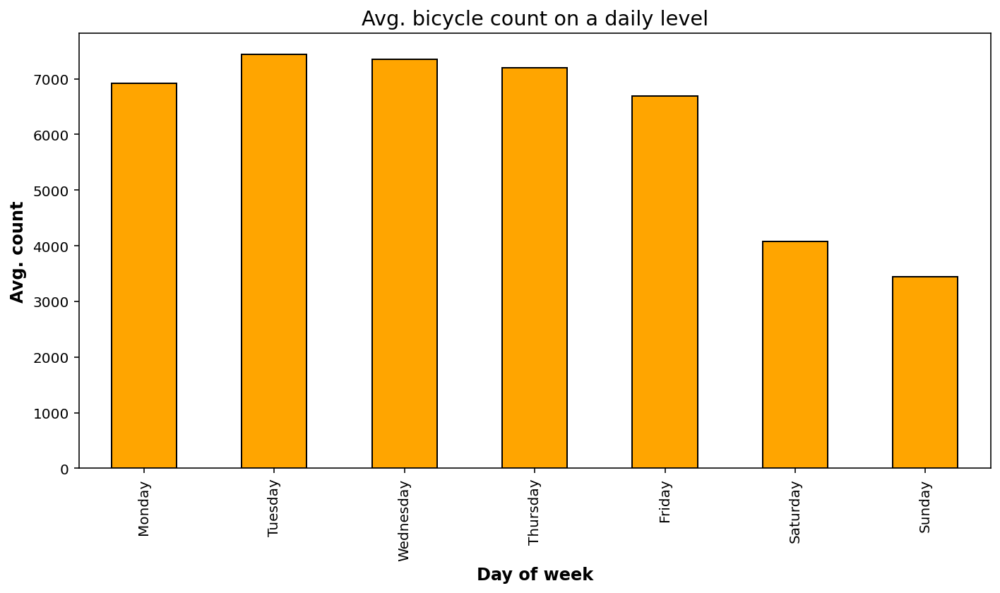

In [113]:
# New Dataframe with avg. count each weekday for all countings stations (except Dr. Louises Bro)
df_w = df[(df.Location != "Dr. Louises Bro") & (df.Direction == "T")]
df_w = df_w.groupby(["DayOfWeek", "DayOfWeek_str"]).mean().reset_index()

#Bar chart with the avg. cyclist count
df_w.plot(kind = "bar", y = "Daily", x = "DayOfWeek_str", legend = False, title = "Avg. bicycle count on a daily level",
    ylabel = "Avg. count", xlabel = "Day of week", color = 'orange', edgecolor = 'black',
    rot = 90, figsize = (10, 6), fontsize = "10")
plt.tight_layout()

Among other things, the weekly pattern shown at the figure above indicates the same as what was presented in [Section 3.1.1](#311): More cyclists on the weekdays and fewer at the weekend. Moreover, it can also be seen that the avg. bicycle counts are slightly greater in the midweek, Tuesday, Wednesday and Thursday, compared to Monday and Friday. This can be explained by some travellers having long weekends and therefore staying home or in their summer cottage for one more day.

**Weekly patterns on a hourly level**

It has been chosen to look into the weekly patterns on a hourly level as the daily bicycling behavior might differ according to the specific weekday. The figure above could hide astounding patterns as it is shown in aggreagted form. 

The figure below illustrate the weekly patterns on a hourly level.

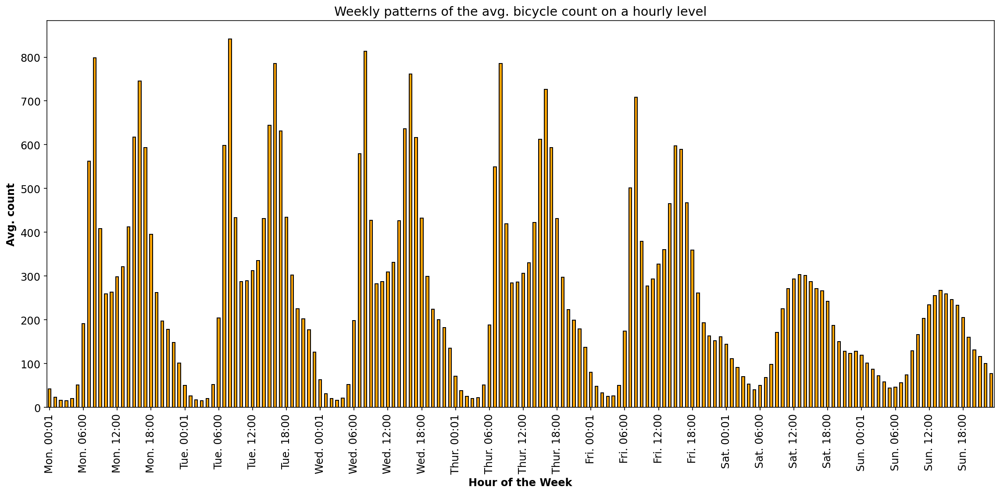

In [114]:
# New Dataframe with avg. count each hour of the week for all countings stations (except Dr. Louises Bro)
df_HoW = df[(df.Location != "Dr. Louises Bro") & (df.Direction == "T")]
df_HoW = df_HoW.groupby(df['DayOfWeek']).mean().loc[:,'00-01':'23-24'].reset_index()
df_HoW = df_HoW.melt(id_vars = ["DayOfWeek"], var_name = "Hour", value_name = "Avg. count")
df_HoW = df_HoW.sort_values(by = ["DayOfWeek", "Hour"]).reset_index(drop = True).reset_index()
df_HoW.rename(columns = {'index':'HoW'}, inplace = True)

# Bar chart with the avg. cyclist count
df_HoW.plot(kind = "bar", y = "Avg. count", x = "HoW", legend = False, title = "Weekly patterns of the avg. bicycle count on a hourly level",
    ylabel = "Avg. count", xlabel = "Hour of the Week", color = 'orange', edgecolor='black',
    rot = 90, figsize = (16, 8), fontsize = "12")

# Ticks and labels with 6 hours space between them.
plt.xticks(ticks = range(0,167,6), labels = ["Mon. 00:01",  "Mon. 06:00",  "Mon. 12:00",  "Mon. 18:00", "Tue. 00:01",  "Tue. 06:00",  "Tue. 12:00",  "Tue. 18:00",
                        "Wed. 00:01",  "Wed. 06:00",  "Wed. 12:00",  "Wed. 18:00", "Thur. 00:01", "Thur. 06:00", "Thur. 12:00", "Thur. 18:00",
                        "Fri. 00:01",  "Fri. 06:00",  "Fri. 12:00",  "Fri. 18:00", "Sat. 00:01",  "Sat. 06:00",  "Sat. 12:00",  "Sat. 18:00",
                        "Sun. 00:01",  "Sun. 06:00",  "Sun. 12:00",  "Sun. 18:00"])
plt.tight_layout()

It might be more clear to observe different patterns if the bars in the histogram are coloured according to the number of bicycle counts. Therefore, the top 5 hours with the most avg. bicycle counts for each day have been calculated below.

In [115]:
# Find the 5 time interval (hours) with the greatest counts each day of the week.
Top5 = []
for idx, c in df_HoW["Avg. count"].iteritems():
    if idx < 24:
        t5 = list(df_HoW["Avg. count"].iloc[0:24].nlargest(n = 5))
    elif idx < 48:
        t5 = list(df_HoW["Avg. count"].iloc[24:48].nlargest(n = 5))
    elif idx < 72:
        t5 = list(df_HoW["Avg. count"].iloc[48:72].nlargest(n = 5))
    elif idx < 96:
        t5 = list(df_HoW["Avg. count"].iloc[72:96].nlargest(n = 5))
    elif idx < 120:
        t5 = list(df_HoW["Avg. count"].iloc[96:120].nlargest(n = 5))
    elif idx < 144:
        t5 = list(df_HoW["Avg. count"].iloc[120:144].nlargest(n = 5))
    else:
        t5 = list(df_HoW["Avg. count"].iloc[144:169].nlargest(n = 5))
    if c in t5:
        Top5.append(1)
    else:
        Top5.append(0)
df_HoW["Top5"] = Top5

<a name="312"></a>
A new figure where the top 5 bars for each day are coloured is shown below.

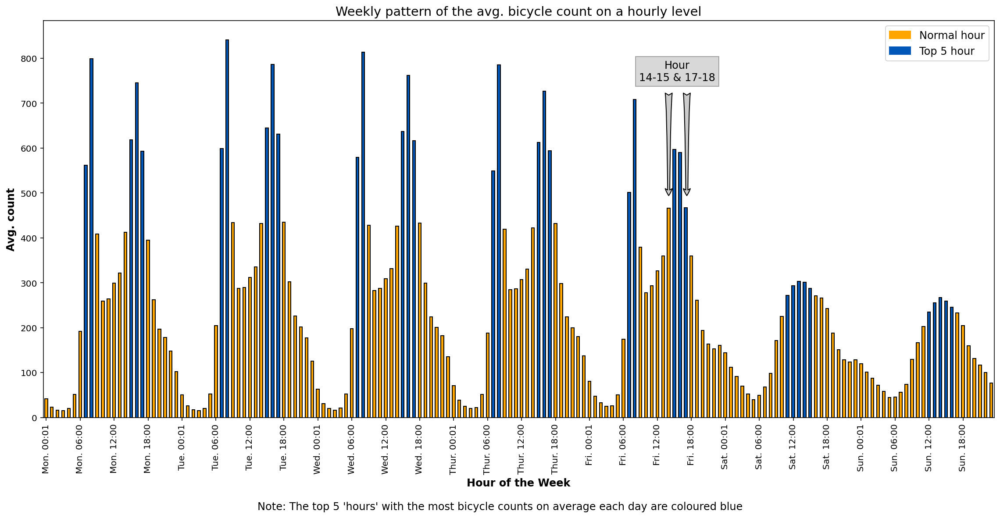

In [116]:
# Bar chart with the avg. cyclist count. The 5 hours with the greates counts are highlighted
colors = {0: "orange", 1: "#0057b7"}

df_HoW.plot(kind = "bar", y = "Avg. count", x = "HoW", legend = False, title = "Weekly pattern of the avg. bicycle count on a hourly level",
    ylabel = "Avg. count", xlabel = "Hour of the Week", color = [colors[i] for i in df_HoW['Top5']], edgecolor = 'black',
    rot = 90, figsize = (16, 8), fontsize = "10")

# Add legend
col = {"Normal hour": "orange", "Top 5 hour": "#0057b7"}
labels = list(col.keys())
handles = [plt.Rectangle((0,0),1,1, color = col[label]) for label in labels]
plt.legend(handles = handles, labels = labels, loc = 'upper right')

# Add arrows and text
plt.text(111.5, 750, 'Hour\n14-15 & 17-18', horizontalalignment = 'center', 
         fontdict = dict(fontsize = 12), bbox = dict(facecolor = 'grey', alpha = 0.3,  edgecolor = 'black'))
plt.annotate('', xy = (110, 490), xytext = (0, 121), textcoords = 'offset points', size = 20, 
            arrowprops = dict(arrowstyle = "fancy", fc = "0.8", connectionstyle = "angle3 ,angleA = 0, angleB = -90"))
plt.annotate('', xy = (113.2, 490), xytext = (0, 121), textcoords = 'offset points', size = 20, 
             arrowprops = dict(arrowstyle = "fancy", fc = "0.8", connectionstyle = "angle3, angleA = 0, angleB = -90"))

# Ticks and labels with 6 hours space between them.
plt.xticks(ticks = range(0,167,6), labels = ["Mon. 00:01",  "Mon. 06:00",  "Mon. 12:00",  "Mon. 18:00", "Tue. 00:01",  "Tue. 06:00",  "Tue. 12:00",  "Tue. 18:00",
                        "Wed. 00:01",  "Wed. 06:00",  "Wed. 12:00",  "Wed. 18:00", "Thur. 00:01", "Thur. 06:00", "Thur. 12:00", "Thur. 18:00",
                        "Fri. 00:01",  "Fri. 06:00",  "Fri. 12:00",  "Fri. 18:00", "Sat. 00:01",  "Sat. 06:00",  "Sat. 12:00",  "Sat. 18:00",
                        "Sun. 00:01",  "Sun. 06:00",  "Sun. 12:00",  "Sun. 18:00"])
ftxt = "Note: The top 5 'hours' with the most bicycle counts on average each day are coloured blue"
plt.figtext(0.5, -0.02, ftxt, wrap = True, horizontalalignment = 'center', fontsize =12)
plt.tight_layout()

First of all, it can be seen that hours with the most bicycle counts are the same for all the weekdays. These are the same as shown in [Section 3.1.1](#311): between 7 and 9 and between 15 and 18. However, the two bars that are highlighted with arrows hint a different pattern on Fridays. Contrary to the four other weekdays, the avg. bicycle counts are almost the same in the hour 14-15 and 17-18 on Fridays. This indicates that the Copenhageners leave earlier from work and school on Fridays. You could expect that some people take an after-work beer, but that is not what can be drawn from the figure, instead people want to get off as early as possible.

Furthermore, it can be inferred that the Copenhageners are slower in getting up and out on the bike on Sundays compared to Saturdays. As it can be seen the blue bars are moved one hour to the right starting from 11 on Saturdays and 12 on Sundays. Maybe we're lazier on Sundays?

<a name="313"></a>
### 3.1.3 Seasonal Patterns


 *How does the cycling in Copenhagen change throughout the year?*

Another interesting pattern to reveal is the monthly bicycle pattern as there might be some seasonal effects of taking the bike rather than other means of transport. The following are based on the average daily bicycle counts for all the years and all 13 locations. The four seasons are coloured to give an indication of how the seasons differ.

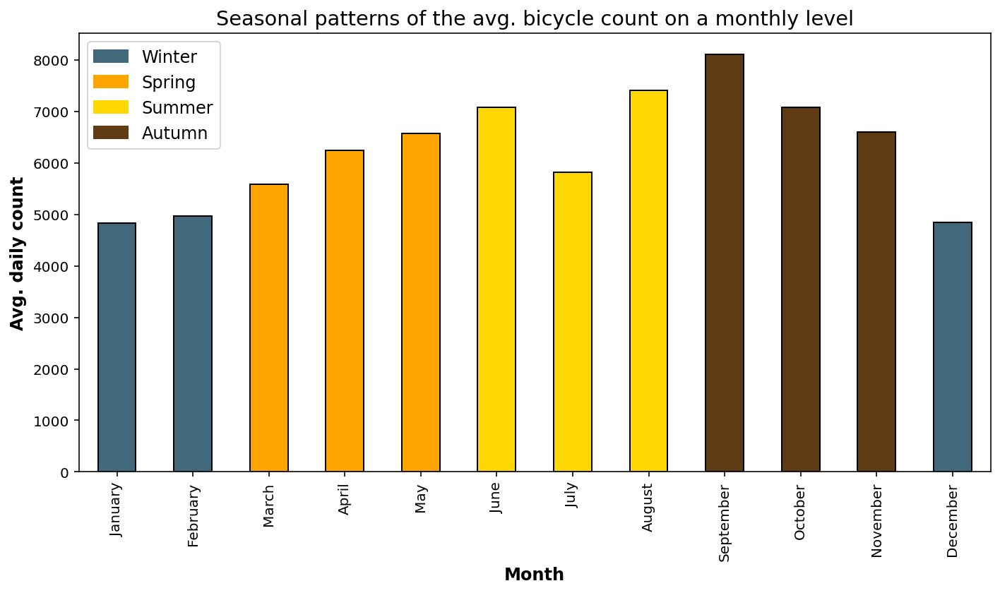

In [117]:
# New Dataframe with avg. count each month for all countings stations
df_m = df[(df.Direction == "T")]
df_m = df_m.groupby(["Month"]).agg({"Daily": np.mean}).reset_index()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df_m['Month'] = pd.Categorical(df_m['Month'], categories = new_order, ordered = True)
df_m.sort_values(by = "Month", inplace = True)

# New column with season and colors
df_m['Season'] = df_m['Month'].apply(lambda x: 'Winter' if x in ["December", "January", "February"] 
                                         else ("Spring" if x in ["March", "April", "May"]
                                            else ("Summer" if x in ["June", "July", "August"] else "Autumn")))

# Colors and labels for seasonality colouring
colors = {"Winter": "#42687C", "Spring": "orange", "Summer": "#FFD700", "Autumn": "#603C14"}
labels = list(colors.keys())
handles = [plt.Rectangle((0,0), 1, 1, color = colors[label]) for label in labels]

#Bar chart with the avg. bicycle count
df_m.plot(kind = "bar", x = "Month", y = "Daily", title = "Seasonal patterns of the avg. bicycle count on a monthly level",
    ylabel = "Avg. daily count", xlabel = "Month", color = [colors[i] for i in df_m['Season']], edgecolor = 'black',
    rot = 90, figsize = (10, 6), fontsize = "10")
plt.legend(handles = handles, labels = labels, loc = 'upper left')
plt.tight_layout()

<a id=’313’></a>
The following can be observed from the figure above:
* People tend to cycle less in the winter season, which most likely is due to the colder and more unstable weather, including snow and sleet. 
* The covetous of taking the bike increases over the spring months as it gets warmer.
* The summer holiday in July induce a decrease in the demand for bicycle trips.
* The avg. daily bicycle counts peaks in September, a month when people have grown accustomed to travelling by bike and the weather is still decent in Denmark.

Interestingly, people tend to cycle more in Autumn compared to Spring. This can be explained by the fact that it is more demanding for an individual to change behaviour and often take time. *It is harder to change a habit and jump on the bike than to remain in the habit and stay on the bike.* Moreover, the weather can also have an effect on the cyclists' desire to get on the bike. Though there are many more hours of sunshine in the Spring and fewer rainy days, the average temperature is around 2.5 °C higher in the Autumn with an average temperature of 10.1 °C compared to the spring of 7.6 °C based on the ten-year average in the period of the data ([DMI, 2022](https://www.dmi.dk/vejrarkiv/manedens-sasonens-og-arets-vejr/tekst-kort-og-nogletal-sason/)). Based on the figure, it could indicate that Copenhageners do not mind cycling in rainy weather, as long as it is not too cold. However, this assumption is something that will be examined in more detail in a later section.

The figure above also resembles reality when looking at the Danish Road Directorate bicycle index in the whole of Denmark. The index verifies the interesting finding that commuters, in general, cycle more in the Autumn than in the Spring, when examining the seasonal variations ([DRD, 2019](https://www.vejdirektoratet.dk/sites/default/files/2019-06/Cykeltællinger_Pixibog_WEB_wcag.pdf)).

**Seasonal patterns for each counting station**

The yearly patterns on a monthly level has also been examined for each of the countings stations to check if there are some locations that deviates from the rest. 

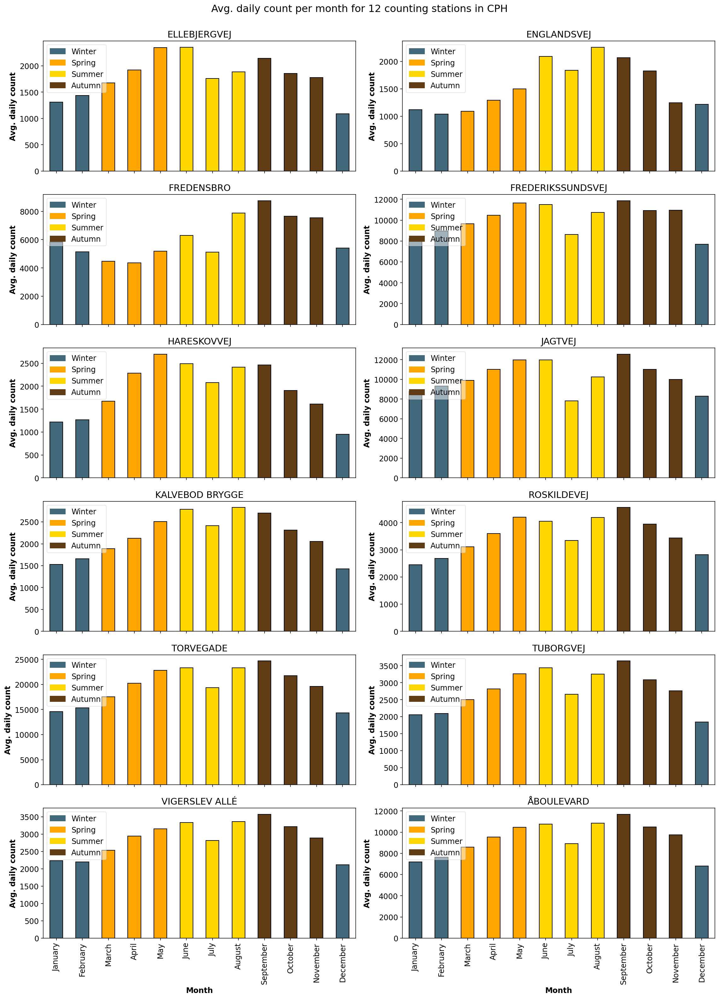

In [118]:
# New Dataframe with avg. count each year for each counting station (except Dr. Louises Bro)
df_mCS = df[(df.Location != "Dr. Louises Bro") & (df.Direction == "T")]
df_mCS = df_mCS.groupby(["Location","Month"]).agg({"Daily": np.mean}).reset_index()
CS_uni = df_mCS["Location"].unique()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df_mCS['Month'] = pd.Categorical(df_mCS['Month'], categories = new_order, ordered = True)
df_mCS.sort_values(by = "Month", inplace = True)

# New column with season and colors
df_mCS['Season'] = df_mCS['Month'].apply(lambda x: 'Winter' if x in ["December", "January", "February"] 
                                         else ("Spring" if x in ["March", "April", "May"]
                                            else ("Summer" if x in ["June", "July", "August"] else "Autumn")))

# Colors and labels for seasonality colouring
colors = {"Winter": "#42687C", "Spring": "orange", "Summer": "#FFD700", "Autumn": "#603C14"}
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color = colors[label]) for label in labels]

# Bar charts with the avg. cyclist count for each CS
fig, axs = plt.subplots(ncols = 2, nrows = 6, figsize = (16, 22), sharex = True) 
fig.suptitle("Avg. daily count per month for 12 counting stations in CPH", fontsize = 16, y = 1)

# Loop through each location and plot yealy pattern
for fc, ax in zip(CS_uni, axs.ravel()):
    df_mCS[df_mCS["Location"] == fc].plot(kind = "bar", x = "Month", y = "Daily", legend = False, edgecolor = 'black',
                                          color = [colors[i] for i in df_mCS[df_mCS["Location"] == fc]['Season']], ax = ax)
    ax.set_title(fc.upper())
    ax.set_ylabel("Avg. daily count")
    ax.set_xlabel("Month")
    ax.legend(handles = handles, labels = labels, loc = 'upper left', framealpha = 0.5)
fig.tight_layout()

As the data are unevenly distributed throughout Copenhagen and not representative you could also expect some deviations from the norm when examining each location separately. Overall, the countings for the different locations have similar patterns to the aggregated figure above. Though, a few locations have slightly higher counts in the Spring compared to the Autumn, including *Hareskovvej* and *Ellebjergvej*. This could be a seasonal effect where these roads that are located in the outer part of Copenhagen more often are used by commuters who cycle far to work and are faster in getting on the bike after the Winter.
*Fredensbro* also differs with much lower counts in the Spring. *Fredensbro* will be looked into in the next section.

### 3.1.4 Yearly Patterns

*How has the cycling in Copenhagen change throughout the years from 2005-2014?*

Even though the dataset only contains information on the bicycle counts in the period 2005-2014, it can still be interesting to see how it has changed in this period of years. Below the daily average bicycle count for each year is shown.

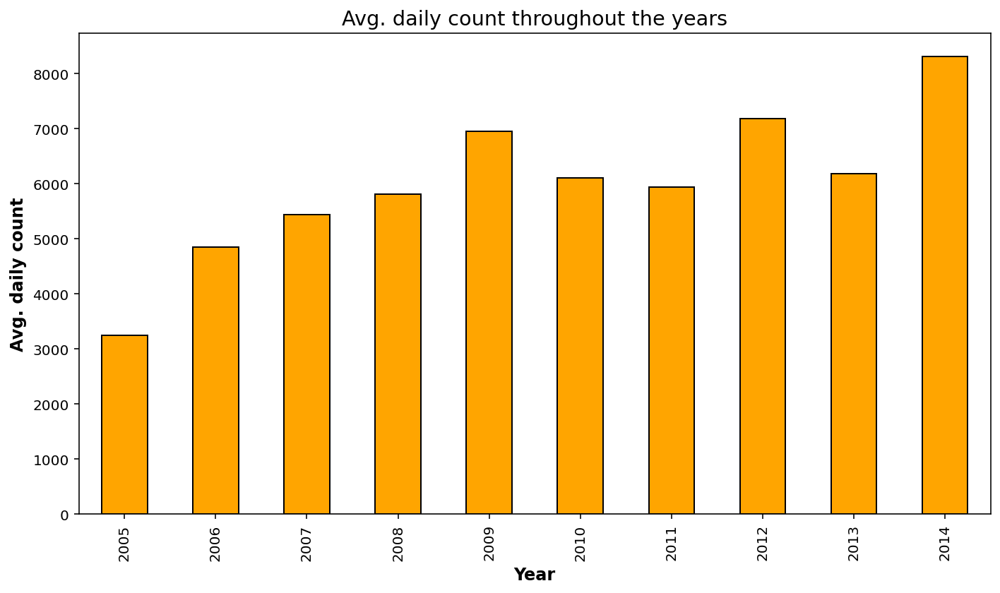

In [119]:
# New Dataframe with avg. count each year for all countings stations (except Dr. Louises Bro)
df_y = df[(df.Location != "Dr. Louises Bro") & (df.Direction == "T")]
df_y = df_y.groupby(["Year"]).agg({"Daily": np.mean}).reset_index()

#Bar chart with the avg. cyclist count
df_y.plot(kind = "bar", x = "Year", legend = False, title = "Avg. daily count throughout the years",
    ylabel = "Avg. daily count", xlabel = "Year", color = 'orange', edgecolor = 'black',
    rot = 90, figsize = (10, 6), fontsize = "10")
plt.tight_layout()

In generel, an upward trend can be seen from the figure. With a daily average bicycle count of approximately 3,000 in 2005 to 8,000 in 2014, 10 years after. 

In [120]:
diff_05_14 = (df_y.Daily.max() - df_y.Daily.min())/df_y.Daily.min()*100
print(f"The bicycle counts for the recorded counting stations in Copenhagen have increased with {round(diff_05_14)} % from 2005 to 2014.")

The bicycle counts for the recorded counting stations in Copenhagen have increased with 156 % from 2005 to 2014.


An increase of 150 % from 2005 to 2014 is quite impressive, and might be due to 2005 being a year with less representative data. In [Section 2](#finaldata) it was shown how the number of counting stations varies for each year, especially in 2005 with only 4 counting stations in data. It is estimated that if the years are to be compared aggregated, the year 2005 should not be included, as it gives a misleading picture in the comparison between the years. Below a new illustration is created without the year 2005.

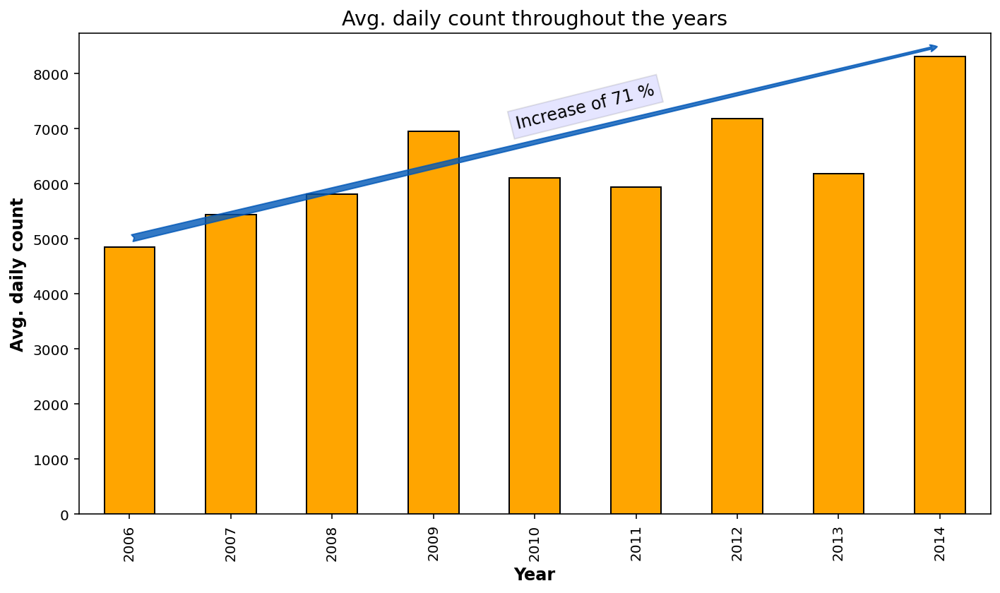

In [121]:
# Exclude year 2015
df_y_o05 = df_y[(df_y.Year != 2005)]

#Bar chart with the avg. cyclist count

df_y_o05.plot(kind = "bar", x = "Year", legend = False, title = "Avg. daily count throughout the years",
    ylabel = "Avg. daily count", xlabel = "Year", color = 'orange', edgecolor = 'black',
    rot = 90, figsize = (10, 6), fontsize = "10")

plt.annotate("", xy = (8, 8500), xytext = (0, 5000), 
             arrowprops = dict(arrowstyle = "fancy", color = "#0057b7", alpha = 0.8))
plt.text(4.5, 7000, 'Increase of 71 %', horizontalalignment = 'center', rotation = 14,
         fontdict = dict(fontsize = 12), bbox = dict(facecolor = 'blue', alpha = 0.1,  edgecolor = 'black'))

plt.show()

In [122]:
diff_06_14 = (df_y_o05.Daily.max() - df_y_o05.Daily.min())/df_y_o05.Daily.min()*100
diff_10_14 = (df_y_o05.Daily.max() - df_y_o05.Daily[5])/df_y_o05.Daily[5]*100
print(f"The bicycle counts for the recorded counting stations in Copenhagen have increased with {round(diff_06_14)} % from 2006 to 2014.")
print(f"The bicycle counts for the recorded counting stations in Copenhagen have increased with {round(diff_10_14)} % from 2010 to 2014.")

The bicycle counts for the recorded counting stations in Copenhagen have increased with 71 % from 2006 to 2014.
The bicycle counts for the recorded counting stations in Copenhagen have increased with 36 % from 2010 to 2014.


By inspecting the the Danish Road Directorates bicycle index from the years 2010 to 2014 in the whole of Denmark, a similar increase to a lesser extent of 25 % appears compared to 36 % in the data. The figure below shows the bicycle index from 2010 to 2020 ([DRD, 2022](https://www.vejdirektoratet.dk/tema/cykler-paa-vejene)).

<img src="Data/Cykeltrafikindeks.png" alt="Drawing" style="width: 500px;"/>

The bicycle index peaks in the year 2014 as the yearly pattern above has shown. More interestingly it can also be seen that the index decreases after 2014, which are years that are not included in the dataset from bicycle counts in Copenhagen. Would the patterns in Copenhagen be the same as in the rest of the Denmark with a peak in 2014? Unfortunately, this is something the authors are unable to answer in this project, due to the limited data available.

By inspecting the figure with the average daily counts throughout the years some years peep out from the trend, including the year 2009 and 2012. The weather can have a great influence on the development of bicycle traffic, and contributes to the fluctuations from year to year. Likewise political initiatives can also incluence the bicycle counts, e.g. bicycle campaigns and major bicycle infrastructure epansions, which will be covered in the next [Section 3.2](#32). 

However, the fluctuations can also be due to lack of data in some days of the years or locations. In order to check for some odd years in the data before predicting, later on, the same yearly period is plotted for each of the 12 countings stations.

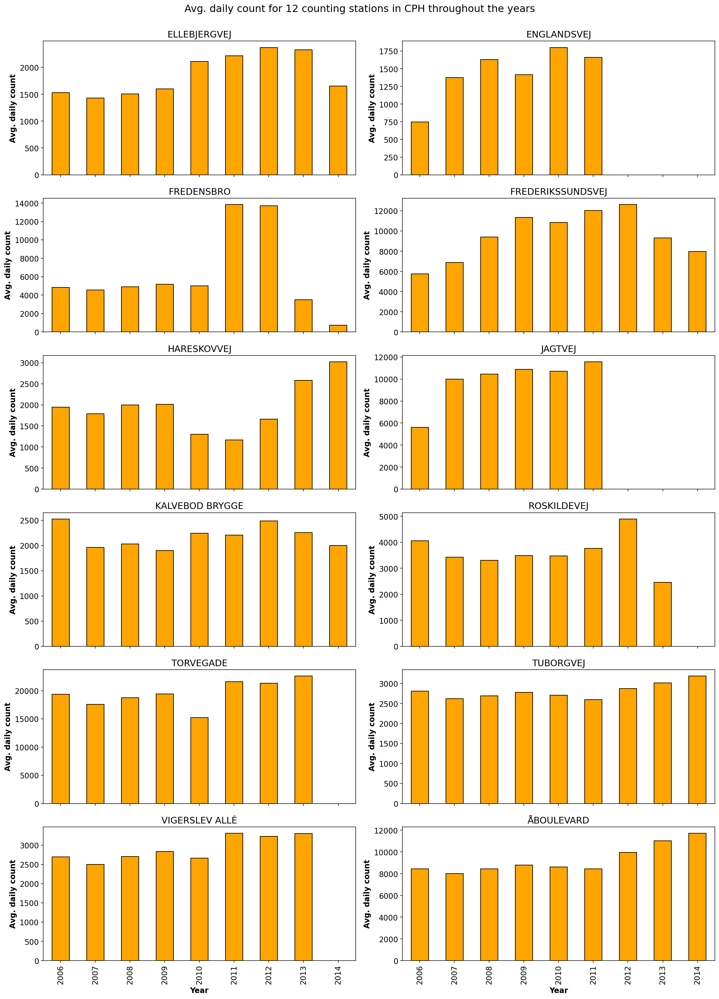

In [123]:
# New Dataframe with avg. count each year for each counting station (except Dr. Louises Bro)
df_yCS = df[(df.Location != "Dr. Louises Bro") & (df.Direction == "T")]
df_yCS = df_yCS.groupby(["Location","Year"]).agg({"Daily": np.mean}).reset_index()
CS_uni = df_yCS["Location"].unique()

# Bar charts with the avg. cyclist count for each CS
fig, axs = plt.subplots(ncols = 2, nrows = 6, figsize = (16, 22), sharex = True) 
fig.suptitle("Avg. daily count for 12 counting stations in CPH throughout the years", fontsize = 16, y = 1)

# Loop through each location and plot yearly pattern
for fc, ax in zip(CS_uni, axs.ravel()):
    df_yCS[df_yCS["Location"] == fc].plot(kind = "bar", x = "Year", legend = False, color = 'orange',
                                          edgecolor = 'black', ax = ax)
    ax.set_title(fc.upper())
    ax.set_ylabel("Avg. daily count")
    ax.set_xlabel("Year")
fig.tight_layout()

First of all, the same increasing trend can be seen from most of the counting stations in the figure above. The last plot of Åboulevarden shows a nice upward pattern from 2011 to 2014. The same tendency from 2011 to 2014 is also presented from other counting stations, including *Tuborgvej* and *Hareskovvej*.

Furthermore, the figure reveals big flaws in one of the counting stations: *Fredensbro*. An extensive increase in the bicycle counts in the years 2011 and 2012 followed by an equally big decrease subsequently is difficult to explain. It has been found that the bridge has been under construction in the years of 2013 and 2014, which can explain the drop to some extent ([Wikipedia, 2021](https://da.wikipedia.org/wiki/Fredensbro)). The surge from 2010 to 2011 also appears in the Municipality of Copenhagens' own traffic counts, and therefore the data is not found unrealistic (The Municipality of Copenhagen, 2016). Though it has not been possible to find the reason for the increase in bicycle counts. As Fredensbro is a special case and could influence the predictions wrongly, later on, the counting station is not a part of the predictions in [Section 3.5](#35).

The other counting stations are found reasonable for predictions.

## 3.2 Effects of Bicycle Infrastructure Expansions <a class="anchor" id="sec3_2"></a>

<a name="32"></a>
In this section, the bicycle patterns over the years, covered in [Section 3.1](#31), will be compared with bicycle infrastructure expansions. Only infrastructure expansions that might have influenced the bicycle counts close to the data collection points will be included and analyzed to find out, how the expansion affects the patterns in the nearby counting stations. Since it is difficult to look at the effect of simple infrastructure upgrades in central Copenhagen, this part will focus on the [Cycle Superhighways](https://supercykelstier.dk/) concept that was implemented in 2012 and has the goal of improving the bicycle infrastructure majorly, as well as move commuters from their cars to bikes. 

Cycle Superhighways is a bike freeway project that was implemented to improve the infrastructure for bicycle riders in Copenhagen and the suburbs of Copenhagen. The first two routes, *Albertslundruten* and *Farumruten*, were implemented in 2012 ([Supercykelstier 1, 2022](https://supercykelstier.dk/rute/albertslundruten/)) and 2013 ([Supercykelstier 2, 2022](https://supercykelstier.dk/rute/farumruten/)) respectively. This following two sections will look further into both routes and the possible effects of the infrastructure improvements. 

### 3.2.1 Cycle Superhighway: Farumruten <a name="321"></a>

Farumruten is a route that might have influenced the bicycle pattern in the data. The route goes directly from Farum, past *Hareskovvej* and ends at *Bellahøj*. The construction began back in 2010, with the first part being done in 2012 and the second part in 2013. Outside of *Hareskovvej*, the route could also have affected the bicycle pattern at *Frederikssundsvej, Jagtvej and Dronning Louises Bro* ([Supercykelstier 1, 2022](https://supercykelstier.dk/rute/farumruten/)). Since the data from *Jagtvej* is not available after 2011, that point will not be analysed. Farumruten and the 3 counting stations are shown on the map below. 

In [124]:
# Creating folium map over copenhagen with the 3 counting points based on GPS coordinates
CPH2 = folium.Map(location = [55.7367, 12.4639], tiles = "CartoDB Positron", zoom_start = 11)

folium.Marker(location = [55.720193, 12.494928], popup = 'Hareskovvej', icon = folium.Icon(color = 'orange', icon = 'bicycle', prefix = 'fa')).add_to(CPH2)
folium.Marker(location = [55.701869, 12.533356], popup = 'Frederikssundsvej', icon = folium.Icon(color = 'orange', icon = 'bicycle', prefix = 'fa')).add_to(CPH2)
folium.Marker(location = [55.686490, 12.564373], popup = 'Dr. Louises Bro', icon = folium.Icon(color = 'orange', icon = 'bicycle', prefix = 'fa')).add_to(CPH2)

# Creating the path of Farumruten based on the GPS coordinates divided into part 1 and 2 (Coordinates source: Supercykelstier, 2022)
farum_route2 = [[55.77482322447139, 12.412921674950825] , [55.775254172476444, 12.41137660854637], [55.77590352819581, 12.40964465911424], [55.77761454261633, 12.406523999083173], [55.77957759910294, 12.404012472665695], [55.783533, 12.399638], [55.786463091317565, 12.396534275828136], [55.78895265783711, 12.3936737608925], [55.79105521214977, 12.390542963565832], [55.79229552068096, 12.389105014705043], [55.79362910087655, 12.3880108], [55.797732025451936, 12.385791372743288], [55.79948930087646, 12.3848825], [55.800164512723875, 12.384326910724766], [55.80077774084324, 12.383640630429358], [55.80204081936611, 12.381915385921946], [55.80249861118671, 12.381414348164613], [55.80308287726177, 12.38105641907886], [55.80392000087639, 12.380857], [55.805131700876366, 12.3809206], [55.80564500087635, 12.3808387], [55.80616720087635, 12.3805766], [55.80674276391134, 12.380196680503753], [55.80695740239149, 12.380034312564277], [55.80879478220182, 12.378255655327408], [55.80936080087631, 12.3777267], [55.80970440087633, 12.377464], [55.8100071008763, 12.377278099999987], [55.81031960087633, 12.377128400000016], [55.81297719927651, 12.376039430369426]]
farum_route1 = [[55.70663480170215, 12.515868531534847] , [55.706771390549825, 12.515638636180972] , [55.70696300087757, 12.5153481] , [55.70730141881947, 12.51466072272239] , [55.70774856937005, 12.513683263696247] , [55.709221428301156, 12.50901560362634] , [55.71264650087753, 12.5045929] , [55.7135863081334, 12.50365255445667] , [55.71689, 12.499682] , [55.7184870793351, 12.497435916231098], [55.71957693958153, 12.495686273031081], [55.72232470777869, 12.491471323300269], [55.7245390733671, 12.487440465861209], [55.72598, 12.484157] , [55.728171, 12.479357], [55.72947103959168, 12.4767559288349], [55.7301753554546, 12.475316448260084] , [55.73295294781807, 12.469386217427058] , [55.73605712937342, 12.463914854789822] , [55.737863612668406, 12.46083312608968], [55.74093564332948, 12.456586511468712], [55.74988, 12.449101], [55.75739227798583, 12.443659223536637], [55.760326, 12.441211], [55.762388914406294, 12.43821463628569], [55.76505886591392, 12.433191575072998], [55.766809600876876, 12.430955099999982], [55.76765450087684, 12.4300453], [55.770637759212796, 12.427601509199777], [55.77114460087679, 12.4269454], [55.77189510087681, 12.42556610000001], [55.772147200876795, 12.4249346], [55.77248571117926, 12.423910361590014], [55.77286710087679, 12.4224743], [55.77424668131882, 12.415698389675757] , [55.77458442447275, 12.41408460718153]]

fr2=folium.FeatureGroup("Farumruten - Part 1")
fr1=folium.FeatureGroup("Farumruten - Part 2")
farum2=folium.vector_layers.PolyLine(farum_route2, popup = '<b>Finished in 2012</b>', tooltip = 'Farumruten - Part 1', color = 'skyblue', weight = 5).add_to(fr2)
farum1=folium.vector_layers.PolyLine(farum_route1, popup = '<b>Finished in 2013</b>', tooltip = 'Farumruten - Part 2', color = '#0057b7', weight = 5).add_to(fr1)

# Adding the path to the map
fr1.add_to(CPH2)
fr2.add_to(CPH2)
folium.LayerControl().add_to(CPH2)

display(CPH2)

The figures below shows the average daily number of bicycles at *Hareskovvej, Frederikssundsvej and Dr. Louises Bro* from 2006 to 2014 (2009 to 2014 for *Dr. Louises Bro*). The light green area shows the construction period for the first part of the route (Farumruten), while the dark green shows the second part of the route. 

In [125]:
# Creating new dataframe for each of the 3 counting stations
df_hareskov = df[(df.Location == "Hareskovvej") & (df.Direction == "T")]
df_hareskov = df_hareskov.groupby(["Year"]).agg({"Daily": np.mean}).reset_index()
df_fred = df[(df.Location == "Frederikssundsvej") & (df.Direction == "T")]
df_fred = df_fred.groupby(["Year"]).agg({"Daily": np.mean}).reset_index()
df_bro = df[(df.Location == "Dr. Louises Bro") & (df.Direction == "T")]
df_bro = df_bro.groupby(["Year"]).agg({"Daily": np.mean}).reset_index()

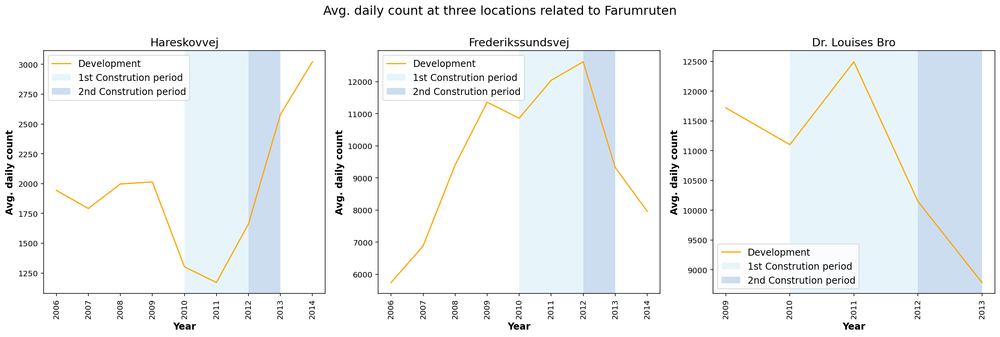

In [126]:
# Line charts with avg. daily counts for each of the points with area marking the 1st and 2nd construction period
fig, axs = plt.subplots(ncols = 3, nrows = 1, figsize = (18, 6)) 
fig.suptitle("Avg. daily count at three locations related to Farumruten", fontsize = 16, y = 1)

df_hareskov.plot(kind = "line", x = "Year", legend = False, title = "Hareskovvej",
    ylabel = "Avg. daily count", xlabel = "Year", color = 'orange',
    rot = 90, fontsize = "10", ax = axs[0])
p = axs[0].axvspan(2010, 2012, facecolor = 'skyblue', alpha = 0.2, zorder = 1)
p2 = axs[0].axvspan(2012, 2013, facecolor = '#0057b7', alpha = 0.2, zorder = 1)
axs[0].legend(["Development", "1st Constrution period", "2nd Constrution period"], loc = 0)

df_fred.plot(kind = "line", x = "Year", legend = False, title = "Frederikssundsvej",
    ylabel = "Avg. daily count", xlabel = "Year", color = 'orange',
    rot = 90, fontsize = "10", ax = axs[1])
p = axs[1].axvspan(2010.0, 2012.0, facecolor = 'skyblue', alpha = 0.2, zorder = 1)
p2 = axs[1].axvspan(2012.0, 2013.0, facecolor = '#0057b7', alpha = 0.2, zorder = 1)
axs[1].legend(["Development", "1st Constrution period", "2nd Constrution period"], loc = 0)

df_bro.plot(kind = "line", x = "Year", legend = False, title = "Dr. Louises Bro",
    ylabel = "Avg. daily count", xlabel = "Year", color = 'orange',
    rot = 90, fontsize = "10", ax = axs[2])
p = axs[2].axvspan(2010.0, 2012.0, facecolor = 'skyblue', alpha = 0.2, zorder = 1)
p2 = axs[2].axvspan(2012.0, 2013.0, facecolor = '#0057b7', alpha = 0.2, zorder = 1)
axs[2].locator_params(axis = "both", integer = True, tight = True)
axs[2].legend(["Development", "1st Constrution period", "2nd Constrution period"], loc = 0)
plt.tight_layout()

The graph for *Harskovvej* shows a decrease in cyclists in the first years of the construction, while there is a clear increase year to year after the first part of the route opened in 2012. Since *Hareskovvej* is directly located at the Farumruten (see the map above), there is a high possibility that the average daily bicycle count over the years has been affected by the implementation of the new infrastructure. The average goes from around 2000 in 2009 to around 3000 in 2014, which is a large jump, that could be argued primarily caused by the Cycle Superhighway.

The plots for *Frederikssundsvej* and *Dr. Louises Bro* shows the opposite of the plot from *Hareskovvej*. The average daily number of cyclists is decreasing from year to year in the last couple of years from the data. This could be related to the data or the uncertainty with the counts in central Copenhagen. Due to these uncertainties, it is difficult to conclude anything about the changes in the two locations based on the implementation of Farumruten.

### 3.2.2 Cycle Superhighway: Albertslundruten

Regarding Albertslundruten, there is not any data collection point specifically on the route, but *Åboulevarden* and *Roskildevej* could be interesting to look into, since those two points are quite close to the route and could have been affected with either an increase or decrease in the number of bicycles, as cyclists are either moving away from the counting station or bringing more cyclists in that area. Albertslundruten and the two data collection points are shown on the map below. 

In [127]:
# Creating folium map with the 2 counting points based on GPS coordinates
CPH3 = folium.Map(location = [55.6761, 12.5683], tiles = "CartoDB Positron", zoom_start = 11)

folium.Marker(location = [55.672778, 12.478680], popup = 'Roskildevej', icon = folium.Icon(color = 'orange', icon = 'bicycle', prefix = 'fa')).add_to(CPH3)
folium.Marker(location = [55.683390, 12.555917], popup = 'Åboulevard', icon = folium.Icon(color = 'orange', icon = 'bicycle', prefix = 'fa')).add_to(CPH3)

# Creating the path of Albertslundruten using GPS coordinates. (Coordinates source: Supercykelstier, 2022)
albertr = [[55.67751180087791, 12.5627504], [55.677539200877945, 12.5626095], [55.67755206879252, 12.562434855911194], [55.6775628329811, 12.562407327480603], [55.67780704338304, 12.559633127488953], [55.67808423292744, 12.556470113440593], [55.6782462572273, 12.554788860394979], [55.67869515653345, 12.552907416810568], [55.67888212971191, 12.55257127531201], [55.679824, 12.548761], [55.67988197316575, 12.548634768205106], [55.67995131939705, 12.548570760852776], [55.6801894008779, 12.5484526], [55.68023131567918, 12.548397381815034], [55.68026562424977, 12.548306503923953], [55.68082037761824, 12.545866714602463], [55.68121760417405, 12.544097403451453], [55.68194142593286, 12.541333974540034], [55.6820480008779, 12.541041299999984], [55.68195610548446, 12.540824950536932], [55.68191417211629, 12.540524202903471], [55.681901712983176, 12.540494449456451], [55.68187468872564, 12.540410572651387], [55.68180350377368, 12.540286797746987], [55.68173380489948, 12.54016370079162], [55.68170537564669, 12.540021429036257], [55.68162388980986, 12.539369380589317], [55.68152019552612, 12.538781440083781], [55.681509094204856, 12.538664688244724], [55.68151645891441, 12.538457963838592], [55.681516360345576, 12.538363763771931], [55.68144453507098, 12.538023918170646], [55.68130983005283, 12.536707306425868], [55.681248399070505, 12.535943292440622], [55.68123187131025, 12.535691132464285], [55.68123503857869, 12.535470726326823], [55.68122158314626, 12.535033175561193], [55.681203534381126, 12.534688608519444], [55.68118718934443, 12.534219207463162], [55.68118072923186, 12.534102891815849], [55.68105942462019, 12.534075840643203], [55.68105156815346, 12.533011961397586], [55.681114807921304, 12.53301224330755], [55.68112666265853, 12.532989544370812], [55.68112725293346, 12.532674249442232], [55.68114284149418, 12.532617491150218], [55.681165526602946, 12.532573085855375], [55.68121213083228, 12.53255745855371], [55.68122819118432, 12.532528195299536], [55.68122846547973, 12.530935784850461], [55.68100254758237, 12.530951175799347], [55.68098611218438, 12.52852933973207], [55.68098230766385, 12.528386686447377], [55.68105873694899, 12.52832657248609], [55.68108293333983, 12.52829559518391], [55.681097220717824, 12.528201137669795], [55.68109555640042, 12.527505890460022], [55.681069082227275, 12.526871240672905], [55.680994626263846, 12.525818760804192], [55.68091524541718, 12.52519383619395], [55.68084601923175, 12.525023132416665], [55.68081807924238, 12.524569335932709], [55.68081176583291, 12.524233091833382], [55.680818871233285, 12.524101013582973], [55.680855724952536, 12.523834872752666], [55.680817918662235, 12.523598388040122], [55.68073166674677, 12.52341325252908], [55.68072019845447, 12.523305270624329], [55.68070872803877, 12.52302789998965], [55.68068070345535, 12.522938487876722], [55.68062318545444, 12.522806448324564], [55.68057232690661, 12.522744703965754], [55.68057098114511, 12.52255115682319], [55.68058577659033, 12.522415507740995], [55.6806675452963, 12.52199509643559], [55.68073418073848, 12.521688009202999], [55.681320297406415, 12.518710921181054], [55.681337723393014, 12.518515670665684], [55.681551, 12.51519], [55.68192906126073, 12.508830497969724], [55.682035167710914, 12.507006498778418], [55.682130561029325, 12.505166756549807], [55.682267284517344, 12.50292016598172], [55.68265185663869, 12.495901616998605], [55.68267364978829, 12.495608690697573], [55.68270768466759, 12.495332534668504], [55.68274924472278, 12.495195928202236], [55.68303981987531, 12.4944269233018], [55.6830684597533, 12.494378039693883], [55.68306845975334, 12.494378039693878], [55.68308743654641, 12.49434193057028], [55.68312958642392, 12.494273487734766], [55.68317885206565, 12.494213516417009], [55.68324779095588, 12.494150349582346], [55.68336264213284, 12.494046717348615], [55.68359149997313, 12.493869084851479], [55.683870889273024, 12.493587026265322], [55.6836332159376, 12.493288528393972], [55.68337865893476, 12.492993479134645], [55.683249082121726, 12.492828420743884], [55.68311615204732, 12.492682870110935], [55.68296323210589, 12.492504059567825], [55.68279571029288, 12.49231816776168], [55.68282926850454, 12.492223879168414], [55.68285599899077, 12.49212869570914], [55.682852448874684, 12.491992696393615], [55.6826787136053, 12.49127128832919], [55.68254200758967, 12.49068151755531], [55.68254400287724, 12.490426720718991], [55.682713020764055, 12.488639744803468], [55.68269625368799, 12.48655754097641], [55.682690271008354, 12.485363243260965], [55.682671, 12.482918], [55.68262961013157, 12.481533203918556], [55.682607162871804, 12.4803366934982], [55.682449434530355, 12.476842588885741], [55.681923663093535, 12.47415722661186], [55.681890957026916, 12.474067332566788], [55.681825347366924, 12.473962442499817], [55.68180788298834, 12.47376791435391], [55.68139326910795, 12.473928000376702], [55.68135802020499, 12.473900674153132], [55.68128742001386, 12.47365710312562], [55.68120200405355, 12.47329695752682], [55.680502580056995, 12.469935935496464], [55.68046195627677, 12.46977987851662], [55.680415745980255, 12.469451495776585], [55.68009311739452, 12.46729238725186], [55.68007246053944, 12.467069789316087], [55.68015032332264, 12.466087999999427], [55.680272004275054, 12.46454043297653], [55.68037420087788, 12.4607219], [55.68041190087789, 12.4593765], [55.68054000087785, 12.455033], [55.68055226176516, 12.453528084758151], [55.6806234008779, 12.452382], [55.68064970087791, 12.4518841], [55.680748052871635, 12.451010106965848], [55.68097800087787, 12.448979499999977], [55.681017900877855, 12.4481012], [55.680996200877885, 12.4461608], [55.68097850087789, 12.4433428], [55.68094579485308, 12.439991288589475], [55.68087920087789, 12.4360568], [55.680832900877924, 12.4339883], [55.68095160087786, 12.4339686], [55.6809950008779, 12.4337826], [55.68102417410974, 12.43354874213244], [55.681263300877895, 12.430967600000017], [55.681028800877876, 12.4308481], [55.68079750087787, 12.4307632], [55.680914, 12.430133], [55.68096559397884, 12.429910488621374], [55.681354800877884, 12.427652300000013], [55.68141149739033, 12.427019007954692], [55.68144303046485, 12.426648663966722], [55.681460645649544, 12.426496313745984], [55.681532, 12.426237], [55.68192877719408, 12.425161825901345], [55.682132100877865, 12.4238441], [55.68215620087787, 12.4237369], [55.682202200877846, 12.423654], [55.68237390087789, 12.423485399999985], [55.68242860087789, 12.4234625], [55.682644, 12.423459], [55.682693241111146, 12.423407751427705], [55.68296360087787, 12.422898], [55.683003800877835, 12.4227751], [55.683041484504066, 12.42243566801689], [55.68301942700054, 12.421762366809416], [55.68307832649543, 12.421019756983036], [55.68309753423429, 12.420680580971537], [55.68307791446311, 12.420557879797691], [55.683020100883176, 12.420408234004523], [55.68300595226617, 12.42029358289457], [55.683013451227986, 12.4201207062662], [55.68302924009621, 12.419938690911092], [55.68305089457491, 12.419722494627571], [55.68310950087784, 12.4193372], [55.683124900877885, 12.4190126], [55.683198000877844, 12.4188732], [55.68317300087787, 12.4183427], [55.68312660087789, 12.4176738], [55.682080800877905, 12.4085369], [55.6815289008779, 12.403746], [55.68142890087787, 12.40276], [55.681416400877886, 12.402332299999987], [55.68142320087786, 12.402006], [55.681472100877876, 12.4014997], [55.68154325989467, 12.401121553898065], [55.68182448343388, 12.399866523719975], [55.68189689967375, 12.399532838081077], [55.68219440087789, 12.3985027], [55.68251357617048, 12.397356358987166], [55.6827414008779, 12.3966025], [55.68323245999669, 12.396931232995533], [55.683232470487646, 12.396931240018665], [55.68371066150231, 12.39700798311842], [55.68443808399237, 12.397474466931], [55.68457500087783, 12.3968447], [55.684640961228716, 12.39633944551936], [55.68466703555686, 12.396045050667523], [55.68469116542738, 12.39557974722381], [55.684667, 12.394071], [55.684592, 12.391284], [55.68451800087784, 12.3881564], [55.684384, 12.383166], [55.68427010087786, 12.3782856], [55.684259300877855, 12.3778675], [55.684195, 12.37704], [55.684018900877824, 12.3761376], [55.68446220087787, 12.375926400000015], [55.684347300877874, 12.375486599999984], [55.68392658275288, 12.375796639587966], [55.68350776876016, 12.376188309191727], [55.683234300877835, 12.37638779999999], [55.68281090087786, 12.3764736], [55.682036700877866, 12.3761196], [55.6818182008779, 12.3760999], [55.681244300877886, 12.376162499999985], [55.68102650087791, 12.3760552], [55.68061520087789, 12.37571190000001], [55.680361200877904, 12.3756475], [55.67903655659099, 12.375775844654157], [55.67738680087795, 12.3759335], [55.67400830087796, 12.3754004], [55.67453310087799, 12.3660738], [55.67455670087795, 12.365443100000011], [55.674774700878004, 12.3616682], [55.674868, 12.360385], [55.674999, 12.359247], [55.675172, 12.357787], [55.67534780087793, 12.3568395], [55.67575450087792, 12.35483820000001], [55.67651890087792, 12.3510145], [55.67651550087793, 12.3508999], [55.67647090087797, 12.3508133], [55.676520700877944, 12.3506917], [55.67653875042212, 12.35060272730209], [55.67656600087793, 12.3504684], [55.67676490087793, 12.3502353], [55.67682490087793, 12.3500773], [55.67691590087797, 12.349994900000013], [55.67701860087792, 12.3499331], [55.677061000877934, 12.349801500000014], [55.67745260087795, 12.3473522], [55.67752370087794, 12.3472123], [55.677553300877946, 12.347191899999986], [55.67773020087791, 12.3472813], [55.67791100087794, 12.3461024], [55.67821430087793, 12.3442305], [55.678000900877926, 12.3430021], [55.67765210087791, 12.3427741], [55.677517, 12.342711], [55.677468600877916, 12.3414047], [55.67748480087791, 12.341202200000014], [55.67773280087792, 12.3402336], [55.677830400877916, 12.3398343], [55.67784180087794, 12.3395354], [55.67760100087792, 12.337235700000017], [55.677586, 12.337143], [55.677413000877934, 12.3366276], [55.67721680087796, 12.335581900000019], [55.67709940087795, 12.335387600000022], [55.67713670087794, 12.3352398], [55.677136840684874, 12.334990943667764], [55.677137800877915, 12.3332818], [55.67713540087791, 12.3319615], [55.67683360087792, 12.331462599999977], [55.676967, 12.331103], [55.677051, 12.330461], [55.677032, 12.329929], [55.676933, 12.329272], [55.676713, 12.328781], [55.676388, 12.328488], [55.676142, 12.328349], [55.675842, 12.328324], [55.67570503372095, 12.328341223186838], [55.67541898933403, 12.328093047550627], [55.6754599247744, 12.326972451740803], [55.675550200877986, 12.326662], [55.67561760087796, 12.3261109], [55.67565160087797, 12.325591], [55.67570260087795, 12.3253382], [55.67637300087795, 12.3234402], [55.67657400087794, 12.323119099999985], [55.676779200877945, 12.3228854], [55.67706670087793, 12.322717700000021], [55.67742370087793, 12.322619199999982]]
ar=folium.FeatureGroup("Albertslundruten")
ablert1=folium.vector_layers.PolyLine(albertr, popup = '<b>Finished in 2012</b>',tooltip = 'Albertslundruten', color = '#0057b7', weight = 5).add_to(ar)

ar.add_to(CPH3)
folium.LayerControl().add_to(CPH3)

display(CPH3)

The two figures below shows the annual development in the average daily number of bicycles on *Åboulevarden* and *Roskildevej*.  

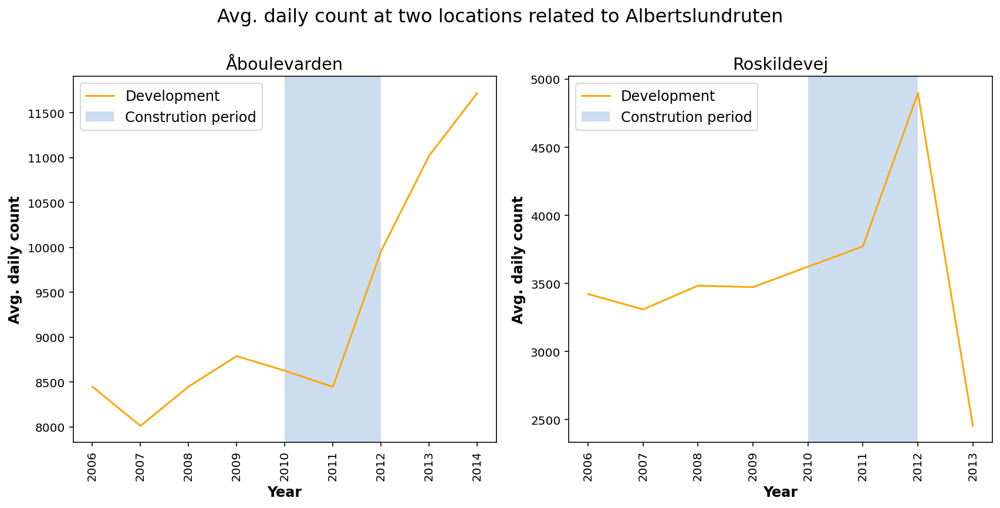

In [128]:
# Creating new dataframe for each of the 2 counting points
df_aab = df[(df.Location == "Åboulevard") & (df.Direction == "T")]
df_aab = df_aab.groupby(["Year"]).agg({"Daily": np.mean}).reset_index()
df_ros = df[(df.Location == "Roskildevej") & (df.Direction == "T") & (df.Year > 2005)]
df_ros = df_ros.groupby(["Year"]).agg({"Daily": np.mean}).reset_index()

#Line plots with avg. daily counts with area showing the construction period
fig, axs = plt.subplots(ncols = 2, nrows = 1, figsize = (12, 6)) 
fig.suptitle("Avg. daily count at two locations related to Albertslundruten", fontsize = 16, y = 1)

df_aab.plot(kind = "line", x = "Year", legend = False, title = "Åboulevarden",
    ylabel = "Avg. daily count", xlabel = "Year", color = 'orange', rot = 90, fontsize = "10", ax = axs[0])
p = axs[0].axvspan(2010.0, 2012.0, facecolor='#0057b7', alpha=0.2,zorder=1)
axs[0].legend(["Development", "Constrution period"], loc = 0)

df_ros.plot(kind = "line", x = "Year", legend = False, title = "Roskildevej",
    ylabel = "Avg. daily count", xlabel = "Year", color = 'orange', rot = 90, fontsize = "10" , ax = axs[1])
p = axs[1].axvspan(2010.0, 2012.0, facecolor='#0057b7', alpha=0.2, zorder=1)
axs[1].legend(["Development", "Constrution period"], loc = 0)
plt.tight_layout()

The plot of *Åboulevarden* shows a large increase in average daily cyclists year to year from the middle of the construction period of Albertslundruten. The increase from 2011 to 2014 is very large and could  have been affected by the new infrastructure. It would be wrong to simply assume that the increase in those numbers is mainly based on the new route, but there is a possibility that it has affected the numbers to some degree.

The plot for the *Roskildevej* shows the opposite. There is a major decrease in the average daily number of cyclists after the implementation of the route. There is also an increase during the construction period. The fall in numbers in the last year could be linked to the data. There is also an argument to be made, that it is quite possible that bicycle commuters living west of Copenhagen moved to *Roskildevej* while Albertslundruten was under construction and afterwards back to the new improved route. However, the short number of years after the implementation of the data makes it difficult to interpret if that is the case and that being the root cause.


## 3.3 Comparison of Bicycle and Car Trends <a class="anchor" id="sec3_3"></a>

This section will focus on comparing the development in bicycle counts and ownership with traffic counts for cars in Copenhagen and the associated car ownership. The purpose is to look further into the bicycle counts from the data and how it relates to the bicycle ownership and to see if there are some interesting patterns, which have not yet been discovered.

The data for bicycle ownership and traffic counts for cars are collected from "Bicycle Statement 2018" which is a yearly report from the Municipality of Copenhagen. The relevant parts of the report cover the development of the mentioned objectives from 2008 to 2014 ([Copenhagen Municipality, 2018](https://www.kk.dk/sites/default/files/agenda/4c7fae49-f9a7-4569-9ebf-449516e6dd51/6a285d53-1f16-4f10-b080-802bcdad1cbf-bilag-2.pdf)). The data for car ownership is collected from the Copenhagen Municipality database ([Copenhagen Municipality, 2022](https://kk.statistikbank.dk/statbank5a/default.asp?w=1536)), while the development in bicycle counts are based on the data frame from the project, where the average daily count is used to find the development since 2008. Note that due to lack of data on car ownership and bicycle ownership, the analysis only covers the years between 2008 and 2014. The analysis also include a comparison with the population of people above the age of 18 in Copenhagen ([Copenhagen Municipality, 2022](https://kk.statistikbank.dk/statbank5a/default.asp?w=1536)).

Below the data from the sources are encoded in a manual way to simplify the comparison. The annual development for the different variables is shown in a line chart, where it is possible for the reader to hover over the lines to see the percentage development. 


In [129]:
# Creating empty figure where the bokeh plots will be shown. 
TOOLS = "pan, wheel_zoom, box_zoom, reset"
bikecar = figure(title = "Comparing traffic counts of bicycles and cars with ownership and population", 
           x_range = ['2008','2009','2010','2011','2012','2013','2014'], tools = TOOLS)

# Creating strings with percentage development of each aspect since 2008
bike_dev = [0.0, 8.0, 15.0, 17.0, 19.0, 22.0, 24.0]
car_dev = [0.0, 0.1, 1.9, 3.3, 4.6, 6.4, 9.9]
car_no = [0.0, -2.6, -1.45, -7.07, -12.08, -10.81, -13.71]
bike_no = [0.0, 22.7, 12.2, 9.5, 23.8, 6.5, 42.9]
pop = [0.0, 1.6, 3.3, 5.2, 7.1, 9.1, 11.2]
year2 = ['2008', '2009', '2010', '2011', '2012', '2013', '2014']

# Ploting the data as line in the figure 
bikecar.line(year2, bike_dev, line_color = "orange", 
       legend_label = "Bicycle ownership", line_width = 3)
bikecar.circle(year2, bike_dev, size = 5, fill_color = "white", 
             line_color = "black", alpha = 0.5)
bikecar.line(year2, bike_no, line_color = "khaki", 
       legend_label = "Bicycle counts", line_width = 3)
bikecar.circle(year2, bike_no, size = 5,fill_color = "white",
             line_color = "black", alpha = 0.5)
bikecar.line(year2, car_dev, line_color = "skyblue", 
       legend_label = "Car ownership", line_width = 3)
bikecar.circle(year2, car_dev, size = 5, fill_color = "white",
             line_color = "black", alpha = 0.5)
bikecar.line(year2, car_no, line_color = "#0057b7", 
       legend_label = "Car counts", line_width = 3)
bikecar.circle(year2, car_no, size=5, fill_color = "white", 
             line_color = "black", alpha = 0.5)
bikecar.line(year2, pop, line_color = "grey", 
       legend_label = "Population", line_width=3)
bikecar.circle(year2, pop, size=5, fill_color = "white", 
             line_color = "black", alpha=0.5)

# Adjusting the functions for the plot
bikecar.add_tools(HoverTool(tooltips=[('Pct. change', '@y{(0.0)}')]))
bikecar.title.align = "center"
bikecar.title.text_font_size = '11pt'
bikecar.legend.location = "top_left"
bikecar.legend.click_policy= "mute"
bikecar.xaxis.major_label_orientation = math.pi/4
bikecar.xaxis.axis_label = 'Year'
bikecar.yaxis.axis_label = 'Pct. change since 2008'
bikecar.toolbar.autohide = True
bikecar.yaxis.axis_label_text_font_style = 'bold'
bikecar.xaxis.axis_label_text_font_style = 'bold'
bikecar.ygrid.grid_line_color = None
bikecar.xgrid.grid_line_alpha = 0.8
bikecar.xgrid.grid_line_dash = [8, 4]
bikecar.y_range.start = -20
show(bikecar)

In the figure above it can be seen how the bicycle ownership is regularly increasing from 2008 to 2014, where especially the first couple of years experience a quite large growth. The development in bicycle counts roughly follows the same pattern. While the growth fluctuates quite a bit on a year-to-year basis, the overall growth from 2008 to 2014 follows the same trend as bicycle ownership. The quality of data used in this project and the fact that it only includes a few counting stations in Copenhagen play a role in why the development of bicycle counts do not have the same regular growth. Overall, there is still an argument to be made, that there is a clear relationship between the bicycle counts and ownership in Copenhagen. This follows the expected development since a larger number of bicycles in the same municipality should at some point affect the number of bicycles on the bike paths. The population growth also follows the same development as the bicycle ownership and counts, which indicates that there is coherence between population and bicycle numbers. 

For the development in car counts and ownership, the two lines do not follow the same pattern. While the number of cars owned is increasing, the total number of cars on the streets of Copenhagen is decreasing. In a large city like Copenhagen, the cars are usually not used for the short trips, but mainly for trips to and from the surrounding municipalities to Copenhagen or around Copenhagen at the Ring Roads. In this project, it is most relevant to investigate how the car numbers could affect the bicycle numbers. While the year-to-year growth in car ownership and bicycle ownership follow the same pattern, the number of cars owned in Copenhagen in 2008 was around 97.000 ([Copenhagen Municipality, 2022](https://kk.statistikbank.dk/statbank5a/default.asp?w=1536)), while the number of bicycles owned was around 544.000 ([Copenhagen Municipality, 2018](https://www.kk.dk/sites/default/files/agenda/4c7fae49-f9a7-4569-9ebf-449516e6dd51/6a285d53-1f16-4f10-b080-802bcdad1cbf-bilag-2.pdf)). The total percentage growth is also much higher for bicycles ownership for the entire period, so while it might be a negative thing that the number of cars owned is growing for the Copenhagen Municipality, it is not affecting the number of cars on the roads within the municipality. The decrease in the number of cars on the roads compared to the high growth in the bicycle ownership and bicycle counts could on the other hand suggest that people have tended to move more from cars to bicycles in the 2008 to 2014 period.

The population is included in the comparison to show that an increase in the number of cyclists in Copenhagen is not only because people cycle more, but may also be due to an increase in the number of residents. One must therefore be careful with one's conclusions, and always have other possible explanations in mind.

## 3.4 The Influence of Weather <a class="anchor" id="sec3_4"></a>

In the following sections, the significance of the weather for the number of cyclists will be examined. Firstly, the necessary data will be imported.

### 3.4.1 Import of Weather Data

To be able to see the influence of the weather and do predictions based on the weather it is needed to obtain some historical weather data. This is obtained through the archives of The Danish Meteorological Institute ([DMI, 2022](https://confluence.govcloud.dk/display/FDAPI)). DMI measures weather data at a variety of locations around Denmark and gathers the data in a database. The specific weather stations that will be used in the following are the one at Landbohøjskolen, at Livgardens Kaserne and one in Jægersborg. The reason for using three different stations is that not all the needed measures are gathered at one station. At Landbohøjskolen temperature is measured while precipitation is measured at Livgardens Kaserne. Both of these places are located centrally in Copenhagen and are, therefore, a good representation of the weather in Copenhagen. The one in Jægersborg is located a little outside of Copenhagen but it is the weather station closest to Copenhagen that measures wind speed which is a parameter very relevant for the analysis and it is therefore included. The map below shows the locations of the counting stations together with the weather stations.

In [130]:
# Crate Folium map with the GPS locations of the counting stations
CPH = folium.Map(location = [55.6761, 12.5683], zoom_start = 10, tiles = 'cartodbpositron')
CPH.add_child(plugins.Fullscreen()) # Add full screen button

# Loop over rows in the dataframe and plot each location labeled with counting station
for i in range(len(CS)):
    html = 'Location: {}'.format(CS.iloc[i]['Location'])
    iframe = folium.IFrame(html, width = 200, height = 40)
    popup = folium.Popup(iframe, max_width = 200)                                          
    folium.Marker(location = [CS.iloc[i]['Latitude'], CS.iloc[i]['Longitude']],
        icon = folium.Icon(color = 'orange', icon = 'bicycle', prefix = 'fa'),
        popup = popup).add_to(CPH)
    
# Make a data frame with dots to show on the map
weatherStations = pd.DataFrame({
   'lat':[55.6814, 55.7664, 55.6858],
   'lon':[12.5403, 12.5263, 12.5768],
   'name':['Landbohøjskolen', 'Jægersborg', 'Livgardens Kaserne'],
}, dtype = str)

# Show the three weather stations
for i in range(0, len(weatherStations)):
   folium.Marker(
      location = [weatherStations.iloc[i]['lat'], weatherStations.iloc[i]['lon']],
      icon = folium.Icon(color = 'darkblue', icon = 'cloud', prefix = 'fa'),
      popup = weatherStations.iloc[i]['name'],
   ).add_to(CPH)

# Show the map
display(CPH)

As it can be seen from the map above two of the weather stations are located in central Copenhagen among the bicycle locations while one is located a little north of Copenhagen. It is assumed that the data gathered at the three stations is representative of all of Copenhagen.

DMI offers a variety of different weather data, but as mentioned above only a small and relevant selection is used. The data that are retrieved are temperatures, wind speeds and precipitation data. The data is retrieved using API. The code is inspired by the User Application Examples that are available on DMI's Open Data webpage ([DMI, 2022](https://confluence.govcloud.dk/display/FDAPI)).

In [131]:
api_key = '74867e98-e783-49bf-98d7-fd105e46021e'

url = 'https://dmigw.govcloud.dk/v2/metObs/collections/observation/items'

# Weather station number
stations = ['06186', '06181', '05735']

# Weather parameters to get from DMI
parameters = ['temp_mean_past1h', 'wind_speed_past1h', 'precip_past1h']

# Define timeperiod
from_time = '2005-01-01T00:00:00Z'
to_time = '2014-12-31T23:59:59Z'
timePeriod = from_time + '/' + to_time

# New dataframe to hold weather data
df_weather = pd.DataFrame()

# Loop through the weather parameters and save in dataframe
for parameter, station in zip(parameters, stations):
    
    params = {'api-key' : api_key,
              'stationId' : station,
              'datetime' : timePeriod,
              'parameterId' : parameter,
              'limit' : '300000'
            }

    r = requests.get(url, params = params)
    json = r.json()
    temporary = pd.json_normalize(json['features'])
    df_weather = pd.concat([df_weather, temporary])

# Save as csv
df_weather.to_csv('weather_data.csv')

The weather data is obtained and it can now be loaded and preprocessed a bit before being merged with the bicycle data. The weather data is obtained as hourly counts but with a lot of missing values. The weather analysis as well as the predictions will use daily bicycle counts and weather data. Therefore downsampling using mean is used to get daily values ([GeeksforGeeks, 2021](https://www.geeksforgeeks.org/how-to-resample-time-series-data-in-python/)).

In [132]:
# Load weather data
df_weather = pd.read_csv('weather_data.csv')

# Keep only time, parameter name and value
df_weather = df_weather[['properties.observed', 'properties.parameterId','properties.value']]

# Convert time column
df_weather['properties.observed'] = pd.to_datetime(df_weather['properties.observed'])

# Resample hourly data to daily data
df_weather = df_weather.groupby('properties.parameterId').resample('D', on = 'properties.observed').mean().reset_index()

# Remove time
df_weather['properties.observed'] = pd.to_datetime(df_weather['properties.observed']).dt.date
df_weather['properties.observed'] = pd.to_datetime(df_weather['properties.observed'], format = "%Y/%m/%d")

# Rearrange dataframe
df_weather = df_weather.pivot(index = 'properties.observed', columns = 'properties.parameterId', values = 'properties.value')

# Rename columns
df_weather = df_weather.reset_index()
df_weather.columns = ['Date', 'Precipitation', 'Temperature', 'Wind speed']

The weather data is now ready and is being merged with the bicycle counts data below. Both a full dataset and a dataset containing only the years 2010 to 2014 are made. The reason for this is that the weather data was not available for all years for all parameters and therefore only the years 2010 and forward are kept as the data for these years are complete. 

In [133]:
# Make new merged dataset
merged_2005_2014 = pd.merge(df, df_weather, on = 'Date')

# New dataset with only years 2010-2014
merged_2010_2014 = merged_2005_2014.dropna(axis = 0)

### 3.4.2 The Importance of Weather

As the weather data is now combined with the counting data a quick analysis of the influence of the weather on the number of cyclists can be conducted. Plots comparing each weather parameter to the average daily bicycle count are generated below.

<a name="34"></a>

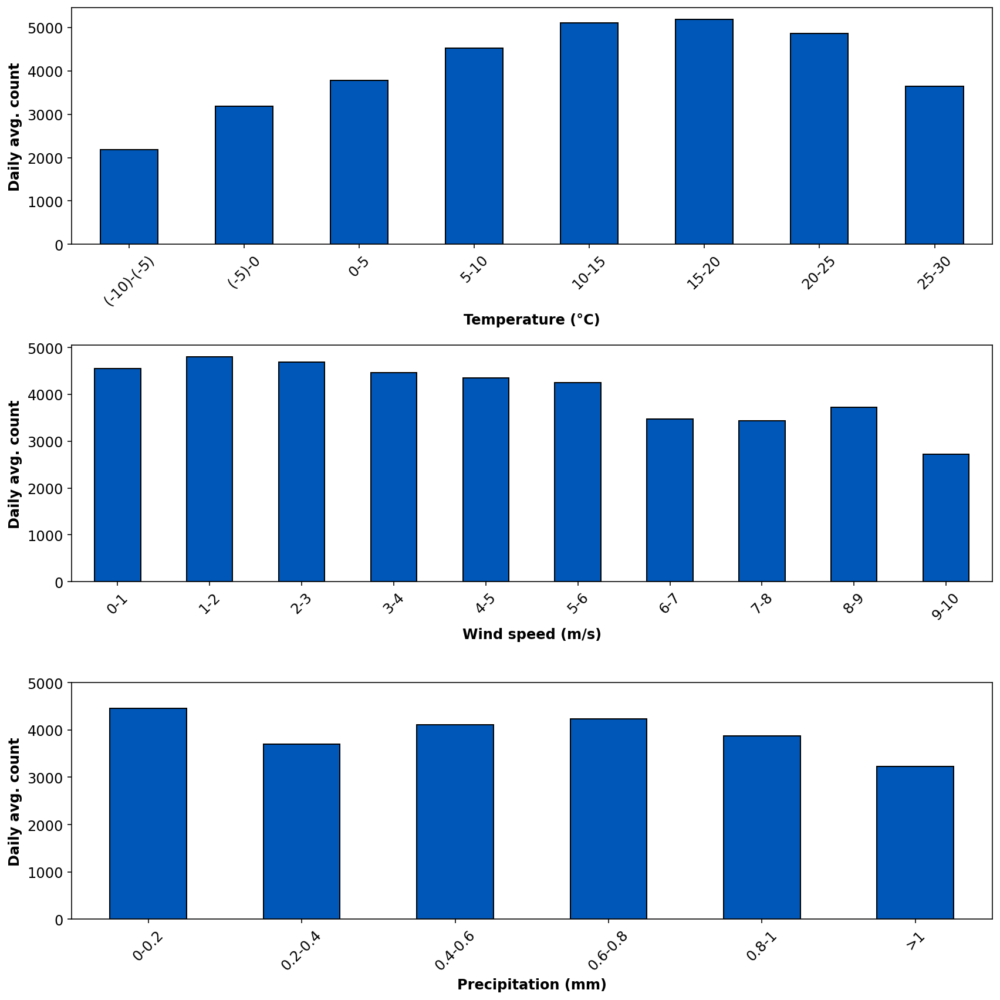

In [134]:
# Subplots settings
fig, axes = plt.subplots(nrows = 3, ncols = 1, figsize = (12, 12))

# Temperature plot
temp = merged_2010_2014.groupby(pd.cut(merged_2010_2014['Temperature'], [-10, -5, 0, 5, 10, 15, 20, 25, 30])).mean()
temp.plot(x = 'Temperature', y = 'Daily', kind = 'bar', color = '#0057b7', grid = False, legend = None, ax = axes[0],
         edgecolor = "black");
plt.sca(axes[0])
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7], ['(-10)-(-5)','(-5)-0','0-5','5-10', '10-15', '15-20', '20-25', '25-30'], rotation = 45);
plt.xlabel('Temperature ('u"\N{DEGREE SIGN}"'C'')');
plt.ylabel('Daily avg. count');

# Wind speed plot
wind = merged_2010_2014.groupby(pd.cut(merged_2010_2014['Wind speed'], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10])).mean()
wind.plot(x = 'Wind speed', y = 'Daily', kind = 'bar', color = '#0057b7', grid = False, legend = None, ax = axes[1],
         edgecolor = "black");
plt.sca(axes[1])
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], ['0-1','1-2','2-3','3-4', '4-5', '5-6', '6-7', '7-8', '8-9', '9-10'], rotation = 45);
plt.xlabel('Wind speed (m/s)');
plt.ylabel('Daily avg. count');

# Precipitation plot
precip = merged_2010_2014.groupby(pd.cut(merged_2010_2014['Precipitation'], [0, 0.2, 0.4, 0.6, 0.8, 1, 8])).mean()
precip.plot(x = 'Precipitation', y = 'Daily', kind = 'bar', color = '#0057b7', grid = False, legend = None, ax = axes[2],
           edgecolor = "black");
plt.sca(axes[2])
plt.xticks([0, 1, 2, 3, 4, 5], ['0-0.2','0.2-0.4','0.4-0.6','0.6-0.8', '0.8-1', '>1'], rotation = 45);
plt.ylim(0, 5000)
plt.xlabel('Precipitation (mm)');
plt.ylabel('Daily avg. count');

In general, the temperature plot clearly indicates that warmer weather leads to more bicycles on the roads. This corresponds well to the expectations. What might seem odd is that the warmest days, temperatures above 20 degrees, actually have slightly lower counts than days with a temperature of 10-20 degrees. The reason for this might very well be that the warmest days are during the summer holidays when fewer people are going to work as well as school causing lower bicycle counts.

The plot with wind speed shows that when a certain wind speed is reached bicycle counts start to decrease. Wind speeds below 6 m/s do not seem to have that much of an influence while a decrease in bicycles is seen clearly for wind speeds above this value.

Before taking a look at the last subplot that shows precipitation compared to bicycle counts it should be noted that the values are an average value across the whole day meaning that the values are rather low. Some days with a lot of rain within only a few hours could likely mean that people avoid using the bike at that day, but these days will not be shown as very rainy if the other hours are dry. Another approach would have been to take the sum of precipitation at each day. This would on the other hand mean that some days would appear as very rainy even if all of the raining is in the night hours where it would not affect the choice of using the bicycle. A look at the plot shows that days with precipitation tend to have slightly fewer cyclists but the trend is not that clear which again could be explained by the use of average precipitation.

## 3.5 Predicting Bicycle Counts <a class="anchor" id="sec3_5"></a>
<a name="35"></a>

In this section different Machine Learning Models will be tested on the data of bicycle counts, weather, and petrol prices. Machine Learning Models can be utilized to find the most important factors for travellers choice of the bicycle or another mean of transport. Moreover, the goal is to build another Machine Learning model, which will be able to predict the  bicycle counts on a day in the future.

The analysis is based on the centrally located bike path at *Åboulevarden* with data from 2010 to 2014. It would be difficult to obtain a true interpretation of the predicted values if you include all the locations in the model as the bicycle counts vary by many thousands, even if you encode each location as a dummy. Basing the analysis on one location makes it easier for the reader to relate to and comprehend the predicted values, and therefore Åboulevarden has been chosen as most Copenhageners have cycled or driven at the stretch. Moreover, it has a high traffic count and there is counts in the data for relatively many days compared to the other counting stations. Below a dataset is created, where the months are encoded as dummies (`OneHotEncoded`).

In [135]:
# Create dataset for predictions 
df_pred = merged_2010_2014[(merged_2010_2014["Location"] == "Åboulevard") & (merged_2010_2014["Direction"] == "T")]

# Select variablese to include
df_pred = df_pred[["Daily", "Year", "Month", "Weekday_Weekend", "PetrolPrice", "Temperature", "Wind speed", "Precipitation"]]

# The weekday/weekend variable is converted to binary valuees
df_pred = df_pred.replace({'Weekday_Weekend': {'Weekday': 1, 'Weekend': 0}})

# Generate binary values for month using OneHotEncoder
df_pred = pd.get_dummies(df_pred, columns = ["Month"], prefix = '', prefix_sep = '')

# Create a copy for the analysis in part 3.5.2
df_pred_fut = df_pred.copy()

### 3.5.1 What influences the choice of the bicycle

In this section a Machine Learning Model is setup to predict factors that could influence the choice of the bicycle. First, the dataset from above is split into a train and a test set using a 70/30 split to build the models on the train dataset and to evaluate them on the test dataset. To be consistent the random state is set to 42
.

In [136]:
# Labels are the values wanted to be predicted - in this case daily counts
labels = np.array(df_pred['Daily'])

# Labels are removed from the dataframe
df_pred = df_pred.drop('Daily', axis = 1)

# Create list of column names (for later use)
features_list = list(df_pred.columns)

# Convert the dataframe into numpy array
features = np.array(df_pred)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size = 0.3, random_state = 42)

Now it is time to fit the model. As the predicting variable has a numeric output it cannot be defined by classes like a Random Forrest Classifier. Instead, Regressors, including Decisions Trees and Random Forrest, will be the basis of the model. Firstly, the Decision Tree Regressor is tested on the train set and the Root Mean Square Error (RMSE) is shown, which is an appropriate indicator to compare different models ([Zack, 2021](https://www.statology.org/rmse-vs-r-squared/#:~:text=Both%20RMSE%20and%20R2,response%20variable%20in%20percentage%20terms)).

In [137]:
# Set random state
dtr = DecisionTreeRegressor(random_state = 42)

# Fit model on train data
dtr.fit(X_train, y_train)

# Predict
y_pred = dtr.predict(X_test)

# Calculate RMSE
reg_RMSE = math.sqrt(np.square(np.subtract(y_test, y_pred)).mean())
print("Root Mean Square Error:", round(reg_RMSE, 1))

Root Mean Square Error: 2577.5


Before elaborating on the results above, a Random Forrest Regressor will be tested. In order to find the best possible model fit, two different `Search functions` will be implemented. The RMSE and the best parameters for a `GridSearchCV`and `RandomizedSearchCV` of the Random Forrest Regressor are shown below.

In [138]:
# Set random state
rfr = RandomForestRegressor(random_state = 42)

# Define grid
param_grid = {
    'bootstrap': [True, False], 
    'max_depth': [5, 10, None], 
    'max_features': ['auto', 'log2'], 
    'n_estimators': [5, 6, 7, 8, 9, 10, 11, 12, 13, 15]
};

# Grid search function
grid_rfr = GridSearchCV(estimator = rfr, param_grid = param_grid);

# Fit model on train data
grid_rfr.fit(X_train, y_train)

# Print best parameters from grid search
print(grid_rfr.best_params_)

# Predict
grid_y_pred = grid_rfr.predict(X_test)

# Calculate RMSE
grid_RMSE = math.sqrt(np.square(np.subtract(y_test, grid_y_pred)).mean())
print("Root Mean Square Error:", round(grid_RMSE, 1))

{'bootstrap': True, 'max_depth': None, 'max_features': 'auto', 'n_estimators': 15}
Root Mean Square Error: 1971.1


In [139]:
# Random search function
random_rfr = RandomizedSearchCV(estimator = rfr, param_distributions = param_grid, n_iter = 200, 
                                scoring = 'neg_mean_absolute_error', cv = 3, verbose = 2, n_jobs = -1, 
                                return_train_score = True);

# Fit model on train data
random_rfr.fit(X_train, y_train)

# Print best parameters from random search
print(random_rfr.best_params_)

# Predict
random_y_pred = random_rfr.predict(X_test)

# Calculate RMSE
random_RMSE = math.sqrt(np.square(np.subtract(y_test, random_y_pred)).mean())
print("Root Mean Square Error:", round(random_RMSE, 1))

Fitting 3 folds for each of 120 candidates, totalling 360 fits
{'n_estimators': 15, 'max_features': 'auto', 'max_depth': None, 'bootstrap': True}
Root Mean Square Error: 1971.1


Above three different models have been estimated. The one with the lowest Root Mean Square Error is chosen to proceed with. Below the RMSE of the three different models is compared.

In [140]:
print("Decision Tree Regressor Model:", round(reg_RMSE,1))
print("Random Forest Regressor Model (GridSearchCV):", round(grid_RMSE,1))
print("Random Forest Regressor Model (RandomizedSearchCV):", round(random_RMSE,1))

Decision Tree Regressor Model: 2577.5
Random Forest Regressor Model (GridSearchCV): 1971.1
Random Forest Regressor Model (RandomizedSearchCV): 1971.1


The RMSE value is the same for both of the Random Forest Regressor and therefore just one of them is picked at random. The Random Forest Regressor with `RandomizedSearchCV` is the one that is used in the following. To further assess the model fit, the plot below visualizes both the original and the predicted data against each other.

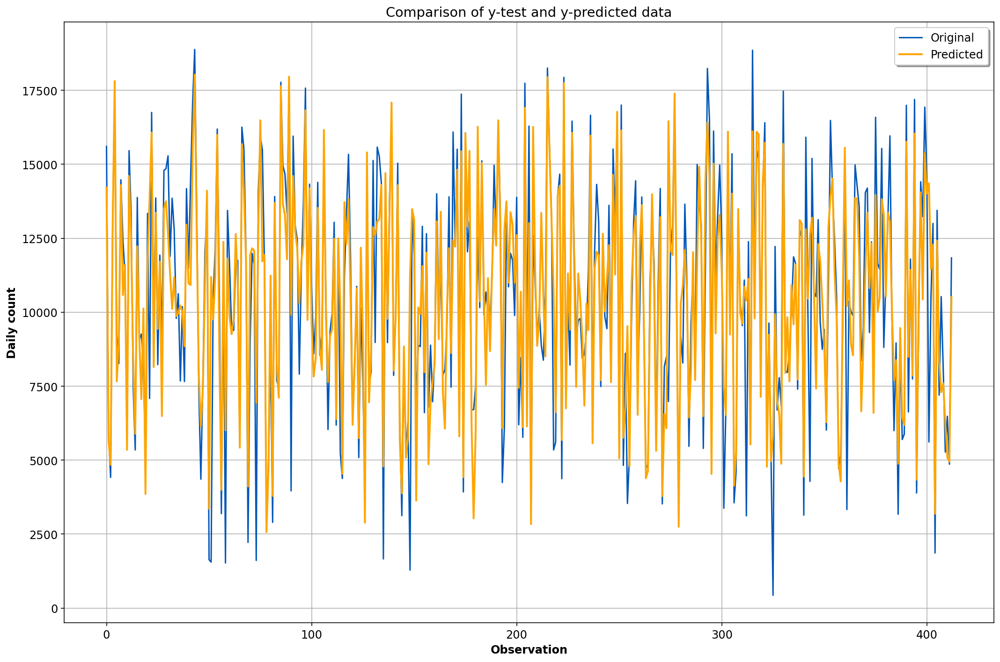

In [141]:
# Visualize original and precited data
x_ax = range(len(y_test))
plt.figure(figsize = (15, 10))
plt.plot(x_ax, y_test, linewidth = 1.5, label = "Original", color = '#0057b7')
plt.plot(x_ax, random_y_pred, linewidth = 2, label = "Predicted", color ='orange')
plt.title("Comparison of y-test and y-predicted data")
plt.xlabel('Observation')
plt.ylabel('Daily count')
plt.legend(loc = 'best', fancybox = True, shadow = True)
plt.grid(True)
plt.show() 

Overall, the predicted values follow the same pattern. Some observations from the data differ from the predicted values. The model does not predict the very low values and very high values that good. With a larger data set the model might be better at predicting these values that do not occour often.

The model can be used to assess the importance of each feature included. The importance of a feature in the model is how much this feature is used in each tree of the forest ([Płoński, 2020](https://mljar.com/blog/feature-importance-in-random-forest/#:~:text=Random%20Forest%20Built%2Din%20Feature%20Importance&text=It%20is%20a%20set%20of,sets%20with%20similars%20responses%20within)). This is very interesting as the feature importance can be used to get a greater comprehension of what influence peoples what affects people's desire to cycle.

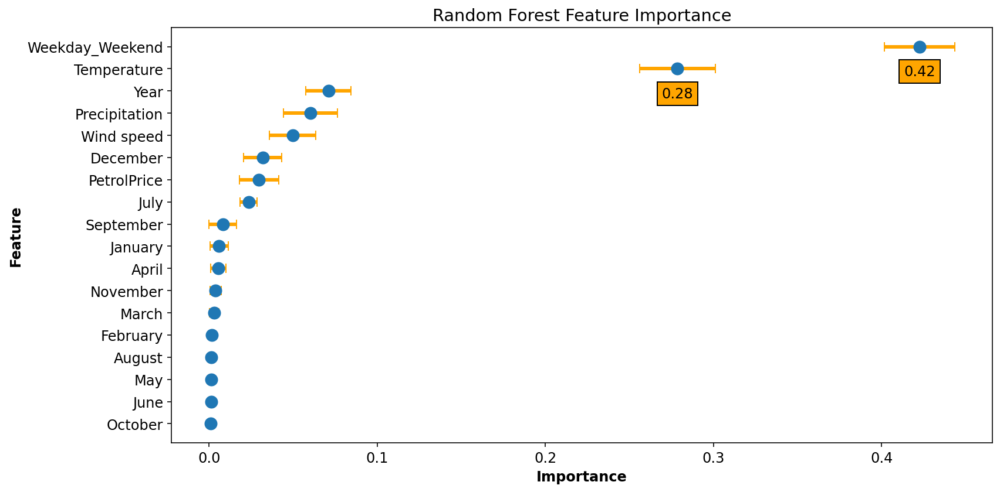

In [142]:
# Create dataframe with feature importance and SE for plot
imp = list(zip(features_list, random_rfr.best_estimator_.feature_importances_));
std = list(zip(features_list, np.std([tree.feature_importances_ for tree in random_rfr.best_estimator_.estimators_], axis = 0)))
df_std = pd.DataFrame(std, columns = ["Feature", "Std"])
df_importance = pd.DataFrame(imp, columns = ['Feature', 'Importance']).sort_values(by = "Importance", ascending = True).merge(df_std)

# Create a range for the errors
rang = range(1, len(df_importance.index) + 1)

# Create errorbars
fig = plt.figure(figsize = (12,6))
err = plt.errorbar(y = rang, x = df_importance["Importance"], xerr = df_importance["Std"] , fmt='o', ecolor= 'orange',
                  markersize='10', capsize = 4, elinewidth = 3)
dots = plt.plot(df_importance['Importance'], rang, "o", color = '#0057b7')

# Annotation
for i, v in enumerate(df_importance["Importance"]):
    if i > 15:
        plt.text(v, i-0.3, f"{v:.2f}", ha ="center", bbox = dict(facecolor='orange', alpha=1))
        
# Add titles and axis names
plt.yticks(rang, df_importance['Feature'])
plt.title("Random Forest Feature Importance", loc = "center")
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

From the above plot of feature importances it is clear that the most important feature is *weekday/weekend* which is as the name suggests an indicator of whether or not the count is done on Monday - Friday or on Saturday - Sunday. Most commuting happens on weekdays as these are the days when most people go to work and school. It therefore also makes sense that this feature is the most important. However, this feature is not that interesting as it does not really have to do with a choice of transport mode but it is rather associated with whether or not an individual has an errand on a specific day.

Another feature with high importance is the *temperature*. This is one of the weather features and it has, as compared to the weekday/weekend feature, a high link to the choice of transport mode. As it was seen in [Section 3.4](#34) people tend to use the bicycle more when the weather is warmer. Therefore, there could also be a seasonal effect included in the feature where people are most likely to cycle in the warmer months. The two other weather variables does not seem to have any significant influence on bicycling in Copenhagen. Interestingly, *precipitation* does not have a impact, which you could expect as there are many negative sides to cycling in the rain. 

It might be the case the two features *weekend/weekday* and *temperature* are the only two factors that have a significant impact on cycling at Åbolevarden. However, this analysis is simplified and in a real context this conclusion will have to be challenged, and tested with a larger model estimation. The authors find it strange that rain does not have a higher influence.

To give a better understanding of how the RandomForestRegressor works a single tree from the forest is visualized. The trees are very deep and showing the full decision tree would cause the trees to be unreadable and becuase of this only 3 levels is shown. So keep in mind that the tree is much more complex than it appears from the visualization. 

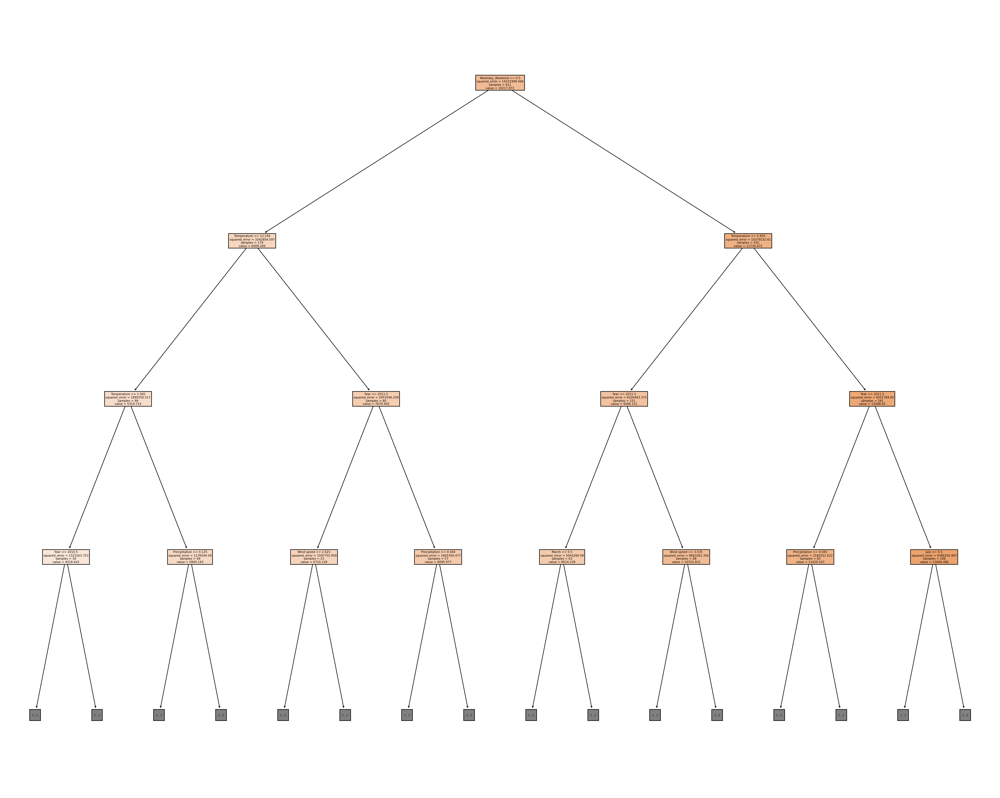

In [143]:
# Plot a tree
fig = plt.figure(figsize = (25, 20))
_ = tree.plot_tree(random_rfr.best_estimator_[1], feature_names = features_list, 
                   class_names = str(labels), max_depth = 3, filled = True)

As the dependent variable is continuous (bicycle count) regression trees are used as compared to classification trees when dealing with categorical dependent variables. The node at the top level of the decision tree looks at the attribute weekday/weekend. Based on the value of this the training set is split into two subsets. One with all days from Monday to Friday and one with Saturdays and Sundays. On the next level, the temperature parameter is selected where the node is split using a greedy approach. This means that the decision tree selects the most homogeneous sub-nodes after splitting the nodes on all the available variables and then picks the best one out of the available splits. The way of choosing the better split is by choosing the one with the lowest variance.
The algorithm continues like this all the way down the tree until leaf nodes are reached ([Niculaescu, 2018](https://elf11.github.io/2018/07/01/python-decision-trees-acm.html)).

### 3.5.2 Predicting the Bicycle Demand in the Future 

Besides showing which factors that influence whether a commuter takes the bike or not, it is also possible to predict the future number of cyclists in a specific year and even month. By the use of Multiple Linear Regression (MLR) it is possible to predict the target variable, daily bicycle counts, using several independent variables: weather conditions, weekend/weekday, year, month and petrol prices ([Investopedia, 2022](https://www.investopedia.com/terms/m/mlr.asp#:~:text=Key%20Takeaways-,Multiple%20linear%20regression%20(MLR)%2C%20also%20known%20simply%20as%20multiple,uses%20just%20one%20explanatory%20variable)). However, it is important to state that there is great uncertainty with the following predictions in this section, and the results must therefore also be taken with some caution.

The following analysis is based on the centrally located bike path at *Åboulevarden* with data from 2010 to 2014. It would be difficult to obtain a true interpretation of the predicted values if you include all the locations in the model as the bicycle counts vary by many thousands, even if you encode each location as a dummy. Basing the analysis on one location makes it easier for the reader to relate to and comprehend the predicted values, and therefore Åboulevarden has been chosen as most Copenhageners have cycled or driven at the stretch. Below a dataset is created, where the months are encoded as dummies. 

In [144]:
# Create dataset for predictions 
df_pred_fut = merged_2010_2014[(merged_2010_2014["Location"] == "Åboulevard") & (merged_2010_2014["Direction"] == "T")]

# Select variables to include
df_pred_fut = df_pred_fut[["Daily", "Year", "Month", "Weekday_Weekend", "PetrolPrice", "Temperature", "Wind speed", "Precipitation"]]

# The weekday/weekend variable is converted to binary valuees
df_pred_fut = df_pred_fut.replace({'Weekday_Weekend': {'Weekday': 1, 'Weekend': 0}})

# Generate binary values for month using OneHotEncoder
df_pred_fut = pd.get_dummies(df_pred_fut, columns = ["Month"], prefix = '', prefix_sep = '')

# Create a copy for later use in predictions
df_pred_fut_copy = df_pred_fut.copy()

Below a correlation matrix is shown in order to check for multicollinearity in regression. Strong correlation between variables can lead to incorrect signs or insignificant variables.

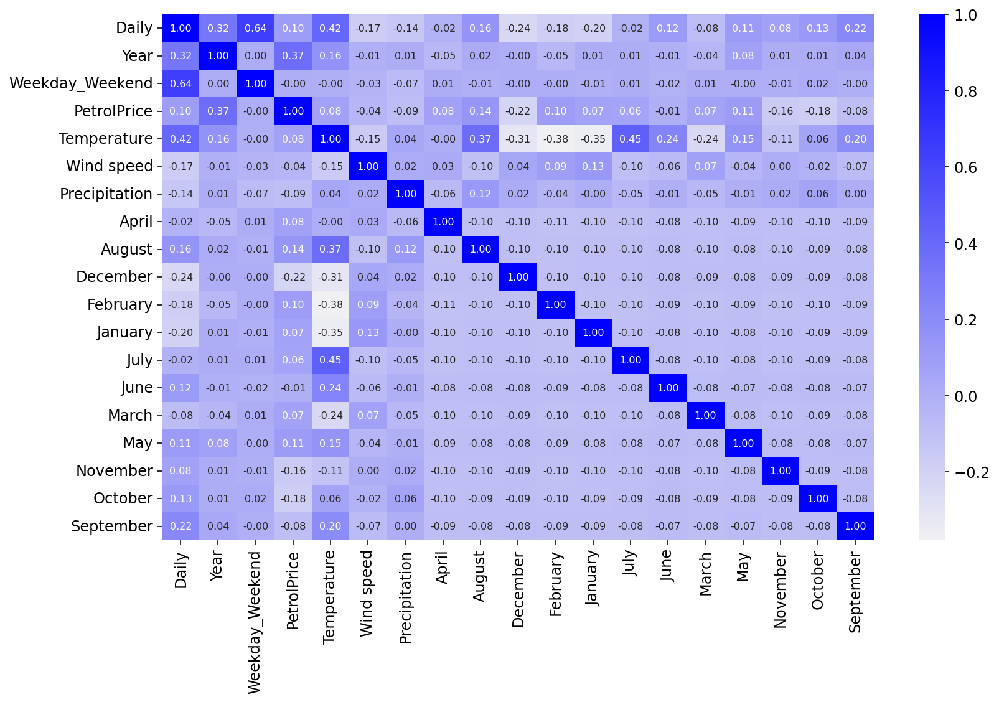

In [145]:
# Multicollinearity figure
fig = plt.figure(figsize = (12,8))
fig = sns.heatmap(df_pred_fut.iloc[:,0:20].corr(), annot = True, cmap=sns.color_palette("light:b", as_cmap=True),
            annot_kws={"size": 8}, fmt='.2f')

Some of the independent variables are slightly correlated, including temperature and the summer months of August (0.37) and July (0.45). Moreover, the petrol prices are correlated with the year (0.37), which indicates that the petrol prices have increased in the time period from 2010 to 2014, even when accounting for inflation. It is estimated that none of the correlations are large enough not to use them in the linear model for now.

Before proceeding, 'January' is removed to ensure that there are `k-1` categorical variables for the months. Having `k` dummy variables in linear regression can create a severe multicollinearity problem for the analysis, which should be avoided ([Star Trek, 2022](https://stattrek.com/multiple-regression/dummy-variables.aspx)).

In [146]:
# Converting month columns to category
df_pred_fut.iloc[:,7:19] = df_pred_fut.iloc[:,7:19].astype('category')

# Dropping 'January' as dummies have been created for, so number of dummies is k-1
df_pred_fut.drop(['January'], axis = 1, inplace = True)

Below the dataframe is split into a train and test dataframe using a 70/30 split to build the models on the train dataset and to evaluate them on the test dataset. Subsequently, a linear model with all the variables from the dataframe is build with the `OLS` function and the summary is printed.

In [147]:
# Split into train and test df
df_train, df_test = train_test_split(df_pred_fut, test_size = 0.3, random_state = 42)

# Dividing the training dataframe into X and Y
y_train_lr = df_train.pop('Daily')
X_train_lr = df_train

# Build a linear regression model
X_train_lm = sm.add_constant(X_train_lr)
lr_1 = sm.OLS(y_train_lr, X_train_lm).fit()
print(lr_1.summary(title = "OLS Regression Results for Linear Regression Model 1", alpha = 0.05))

             OLS Regression Results for Linear Regression Model 1             
Dep. Variable:                  Daily   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.778
Method:                 Least Squares   F-statistic:                     198.8
Date:                Tue, 10 May 2022   Prob (F-statistic):          1.51e-297
Time:                        21:13:14   Log-Likelihood:                -8568.7
No. Observations:                 962   AIC:                         1.717e+04
Df Residuals:                     944   BIC:                         1.726e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -1.389e+06   9.05e+04    -

It can be observed, that the variable 'Petrol prices' is highly insignificant, as the p-value is much higher than 0.05 and therefore it is removed as a starting point. This could indicate that petrol prices have no impact on cycling. It obviously takes more than high petrol prices to get car owners to choose the bike. This is because the primary costs of being a car driver is associated to owning the car (taxes and insurance), while fuel is only a secondary cost. By removing 'Petrol prices' the possible multicorrelation between 'Year' and 'Petrol prices' is also eliminated.

In [148]:
# Drop the insignificant variable 'Petrol price'
X = X_train_lr.drop('PetrolPrice', axis = 1)

# Build a fitted model after dropping the variable
X_train_lm = sm.add_constant(X)
lr_2 = sm.OLS(y_train_lr, X_train_lm).fit()

# Printing the summary of the model
print(lr_2.summary(title = "OLS Regression Results for Linear Regression Model 2", alpha = 0.05))

             OLS Regression Results for Linear Regression Model 2             
Dep. Variable:                  Daily   R-squared:                       0.781
Model:                            OLS   Adj. R-squared:                  0.778
Method:                 Least Squares   F-statistic:                     211.2
Date:                Tue, 10 May 2022   Prob (F-statistic):          1.72e-298
Time:                        21:13:14   Log-Likelihood:                -8569.2
No. Observations:                 962   AIC:                         1.717e+04
Df Residuals:                     945   BIC:                         1.726e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -1.348e+06   8.13e+04    -

It can now be observed, that the dummy category variable 'February' is statistically insignificant, as the p-value is higher than 0.05, and therefore it is removed. This could indicate that there are no statistical difference in daily bicycle counts in the months of January and February, which was also to be seen on the 'Seasonal Patterns' figure in [Section 3.1.3](#313).

In [149]:
# Drop the insignificant variable 'February'
X = X.drop('February', axis = 1)

# Build a fitted model after dropping the variable
X_train_lm = sm.add_constant(X)
lr_3 = sm.OLS(y_train_lr, X_train_lm).fit()

# Printing the summary of the model
print(lr_3.summary(title = "OLS Regression Results for Linear Regression Model 3", alpha = 0.05))

             OLS Regression Results for Linear Regression Model 3             
Dep. Variable:                  Daily   R-squared:                       0.781
Model:                            OLS   Adj. R-squared:                  0.777
Method:                 Least Squares   F-statistic:                     224.7
Date:                Tue, 10 May 2022   Prob (F-statistic):          3.99e-299
Time:                        21:13:14   Log-Likelihood:                -8570.5
No. Observations:                 962   AIC:                         1.717e+04
Df Residuals:                     946   BIC:                         1.725e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -1.34e+06   8.12e+04    -

The summary above shows no signs of insignificant variables and all the signs of the estimates make sense. Some expectations are:
* An increase in the avg. daily cyclists at Åboulevarden each year.
* Way more cyclist at a weekday compared to the weekend. 
* An increase in the number of cyclists when the temperatur rises.
* A decrease in the number of cyclists the more it rains and the wind blows.
* A decrease in the number of cyclists in the holiday months of July and December compared to January and February.
* An increase in the number of cyclists in the other months compared to January/February with September being the month where most cyclists could be expected. 

Before being completely satisfied with the model it is essential to check if the error terms are normally distributed, which is one of the major assumptions of linear regression ([Investopedia, 2022](https://www.investopedia.com/terms/m/mlr.asp#:~:text=Key%20Takeaways-,Multiple%20linear%20regression%20(MLR)%2C%20also%20known%20simply%20as%20multiple,uses%20just%20one%20explanatory%20variable)). Below the error terms of the predicted and true values of the train set are plotted.

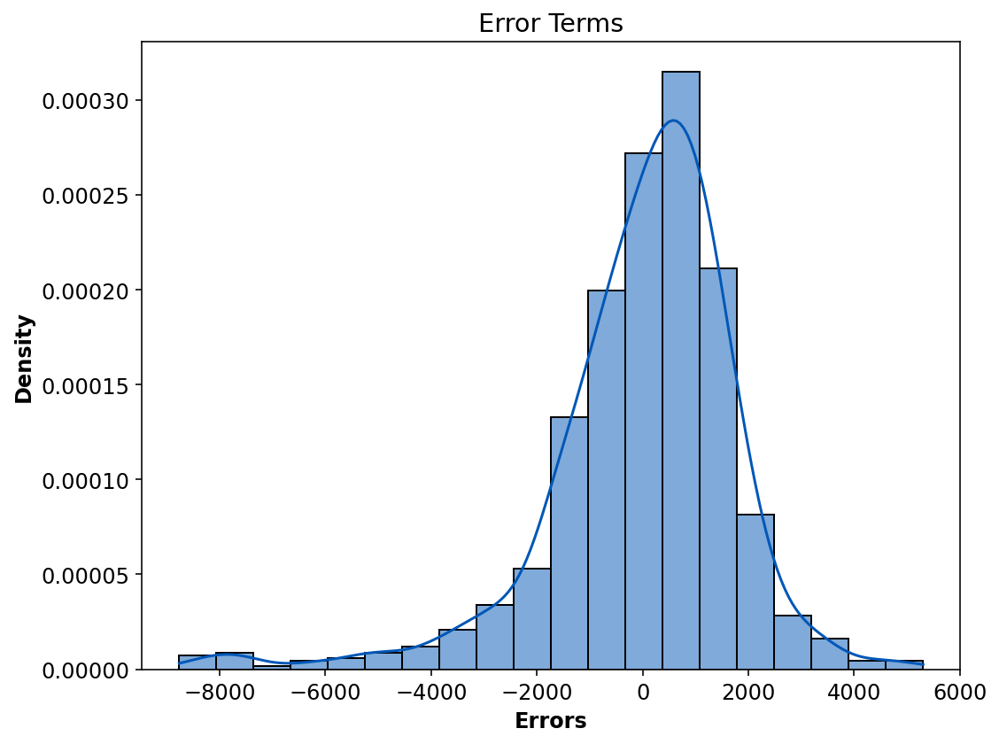

In [150]:
# Find the predicted values of the model with the train set.
y_pred_m3_train = lr_3.predict(X_train_lm)

# Plot the histogram of the error terms
fig = plt.figure(figsize = (8,6))
fig = sns.histplot((y_train_lr - y_pred_m3_train), color = "#0057b7", kde = True, stat = "density", linewidth = 1, bins = 20)
plt.title('Error Terms')
plt.xlabel('Errors')
plt.show()

It can be seen from the figure above that the error terms resemble closely to a normal distribution. It can be argued that it has a left tail, which is caused by a few observations (outliers) in the data. However, the authors have assessed to continue with the 'Linear Regression Model 3' as finding the best possible statistical model for predictions is out of the scope of this course. Therefore, it is now possible to test the Final Model on the test data.

Firstly, the test dataframe is divided into X and Y, and the variables earlier dropped from the train set is  also dropped for the test set.

In [151]:
# Dividing the test dataframe into X and Y, but first save extra df for later use
df_test_extra = df_test.copy()
y_test_lr = df_test.pop('Daily')
X_test_lr = df_test

# Adding constant variable to test dataframe
X_test_m3 = sm.add_constant(X_test_lr)

# Creating X_test_m3 dataframe by dropping variables from X_test_m3
X_test_m3 = X_test_m3.drop(["PetrolPrice", "February"], axis = 1)

# Making predictions using the final model
y_pred_m3_test = lr_3.predict(X_test_m3)

Now the R² and RMSE are calculated for the prediction of the test set to see if the final predicted model is best fitted or not. Optimally the R² value for the test set should be equal to the R² value for the train set of 0.78 (printed in summary above). Moreover, the absolute difference between the RMSE values for the train and test set should be as slightly as possible. The R² gives an indication of how well the estimated linear model predicts the value of the daily bicycle counts in percentage terms, while the RMSE indicates absolute terms ([Zack, 2021](https://www.statology.org/rmse-vs-r-squared/#:~:text=Both%20RMSE%20and%20R2,response%20variable%20in%20percentage%20terms)).

In [152]:
# Calculate R2 for the test and train set and print values
r2_train = r2_score(y_true = y_train_lr, y_pred = y_pred_m3_train)
r2_test = r2_score(y_true = y_test_lr, y_pred = y_pred_m3_test)
print("R2 Train set:", round(r2_train, 3))
print("R2 Test set:", round(r2_test, 3))

# Get the RMSE for the train dataset
lr_RMSE_train = np.sqrt(mean_squared_error(y_train_lr, y_pred_m3_train))
print("RMSE Train:", round(lr_RMSE_train, 1))
 
# Get the RMSE for the test dataset
lr_RMSE_test = np.sqrt(mean_squared_error(y_test_lr, y_pred_m3_test))
print("RMSE Test:", round(lr_RMSE_test, 1))

# Is the RMSE value accurate? Calculate the normalized RMSE for both test and train set
lr_normRMSE_train =  lr_RMSE_train/(y_train_lr.max() - y_train_lr.min())
lr_normRMSE_test =  lr_RMSE_test/(y_test_lr.max() - y_test_lr.min())
print("Normalized RMSE Train:", round(lr_normRMSE_train, 3))
print("Normalized RMSE Test:", round(lr_normRMSE_test, 3))

R2 Train set: 0.781
R2 Test set: 0.743
RMSE Train: 1790.3
RMSE Test: 2016.9
Normalized RMSE Train: 0.098
Normalized RMSE Test: 0.109


Since the R² values for the train and test set are close, the model built is assessed to be 'statistically good enough' for predictions. With the daily bicycle counts varying by thousands, the model is also assessed to be appropriate based on the difference in the RMSE values and normalized RMSE. However, the authors are aware that you could improve the model even more to get more accurate predictions of the number of cyclists.

Below the predicted vs actual bicycle counts are plotted for both the test and train set.

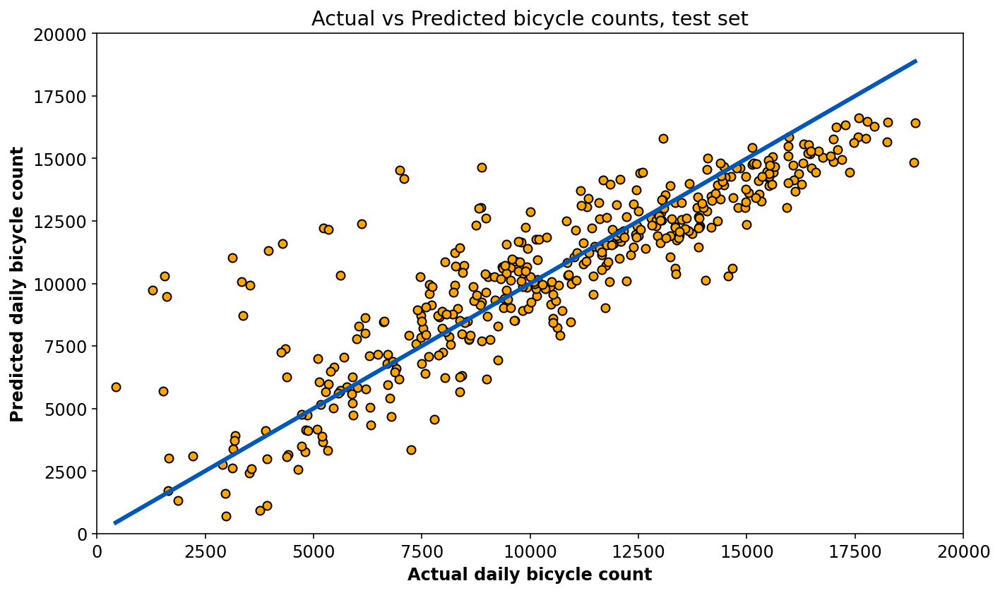

In [153]:
# Plot predicted vs actual bicycle counts, test data
fig = plt.figure(figsize = (10, 6))

# Plot points and linear regression line
plt.scatter(y_test_lr, y_pred_m3_test, color = 'Orange', edgecolors = "black")
p1 = max(max(y_pred_m3_test), max(y_test))
p2 = min(min(y_pred_m3_test), min(y_test))
plt.plot([p1, p2], [p1, p2], color = "#0057b7", linewidth = 3)
plt.title('Actual vs Predicted bicycle counts, test set')
plt.xlabel('Actual daily bicycle count')
plt.ylabel('Predicted daily bicycle count')
plt.xlim([0,20000])
plt.ylim([0,20000])
plt.show()

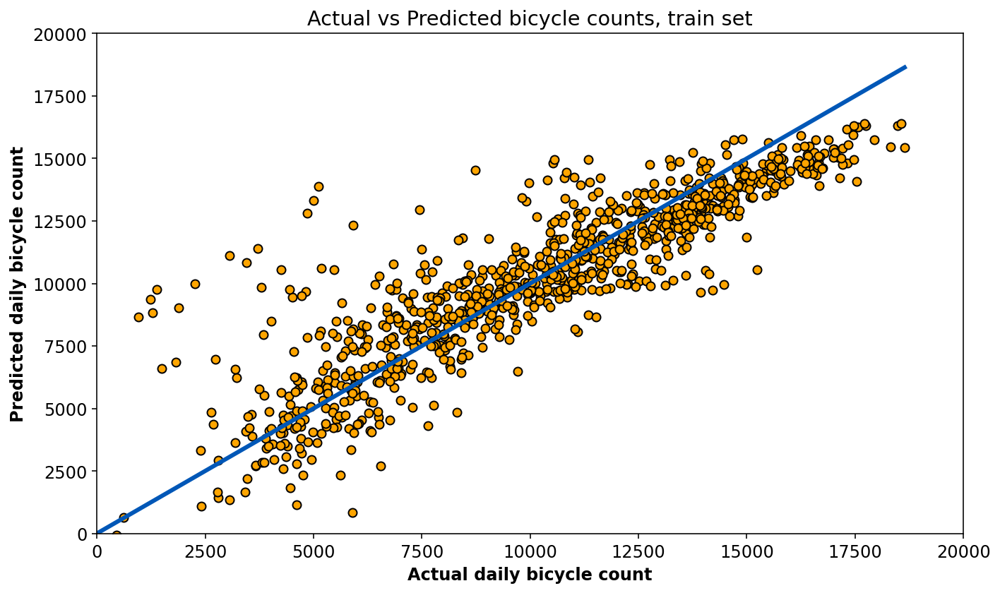

In [154]:
# Plot predicted vs actual bicycle counts, train data
fig = plt.figure(figsize = (10, 6))

# Plot points and linear regression line
plt.scatter(y_train_lr, y_pred_m3_train, color = 'Orange', edgecolors = "black")
o1 = max(max(y_pred_m3_train), max(y_train))
o2 = min(min(y_pred_m3_train), min(y_train))
plt.plot([o1, o2], [o1, o2], color = "#0057b7", linewidth = 3)
plt.title('Actual vs Predicted bicycle counts, train set')
plt.xlabel('Actual daily bicycle count')
plt.ylabel('Predicted daily bicycle count')
plt.xlim([0, 20000])
plt.ylim([0, 20000])
plt.show()

Like what have been observed above on the error terms plots, there are some observations that differs from the norm. These are most likely outliers. In general a linear tendency can be observed and the model is satisfactory.

As mentioned the aim is to predict the number of bicycle counts in the future by the use of the Final Model. The starting point is an average day for both month and year. I.e. for example, an average of all observations is taken with the predicted values for the year 2015. To compare the average daily count of the model predictions with the actual counts, a comparison is printed for the years 2010 to 2014 below.

In [155]:
# Calculate the predicted average bicycle counts for each year on an average day.
years = np.sort(X_test_m3["Year"].unique())
print("Avg. bicycle count for actual values and predicted values respectively")

# Loop through each year of the test set
for year in years:
    avgcount_true = np.mean(y_test_lr[X_test_m3["Year"] == year])
    avgcount_predict = np.mean(y_pred_m3_test[X_test_m3["Year"] == year])
    print(f"- Year {year}: {round(avgcount_true)} & {round(avgcount_predict)}")

Avg. bicycle count for actual values and predicted values respectively
- Year 2010: 8752 & 8662
- Year 2011: 8362 & 8789
- Year 2012: 10202 & 9748
- Year 2013: 11296 & 11545
- Year 2014: 12141 & 12010


As it can be observed the difference between the average bicycle counts in the model and the actual values are quite close for each of the year in the data period. 

Below a scenario for each year between 2010 and 2030 is set up, where the year in the data is fixed to one of the future years. Thereby, the same data is used, but the year column is changed in order to find the bicycle counts in a future year. The Final Model predicts on the basis of the data where the x-values for the years differs. The following results in a prediction with the average count each year, and the associated standard error and 95 % confidence interval and predictions intervals. The latter is significant for the interpretation of the predictions due to the extensive amount of uncertainty. Confidence intervals show us the likely range of values of our population mean whereas the prediction interval tells us about the distribution of the individual values, in this case the average daily bicycle counts ([Olezak, 2021](https://towardsdatascience.com/confidence-intervals-vs-prediction-intervals-7b296ae58745)).

One should be aware that all other variables are unchanged in the predictions to simplify the interpretation. However, some might argue that the weather conditions in 2030 could be more servere compared to 2010, which has not been taken into account in the following.

In [156]:
# Calculate predicted values for each year between 2010 and 2030
fut_years = np.arange(2010, 2031)
steps = []
X_test_copy = X_test_m3.copy()

# Loop through the 21 years and get predictions
for year in fut_years:
    # Change the year in the dataframe and get predictions based on the model
    X_test_copy["Year"] = year
    predictions = lr_3.get_prediction(X_test_copy)
    
    # Get avg., standard error, confidence interval (95 %) for each observation in test set
    preddf = predictions.summary_frame(alpha = 0.05)
    
    # Calculate mean of all the observations and append to list
    mean = list(preddf.mean())
    steps.append(mean)

# Create dataframe with the results from above and append the years
df_fut_count = pd.DataFrame(data = steps, columns = list(preddf.columns))
df_fut_count.insert(0, 'Year', fut_years)

# Calculate the increase in pct. from year 2010
df_fut_count["Pct_inc"] = round((df_fut_count["mean"] - df_fut_count["mean"][0]) / df_fut_count["mean"][0] * 100, 1) 


In [157]:
# Plot predictions in the future with Bokeh
source = ColumnDataSource(df_fut_count)
TOOLS = "pan, wheel_zoom, box_zoom, reset"
p1 = figure(tools = TOOLS, width = 800, height = 500, 
           title = "Predicted avg. bicycle count at Åboulevarden, annually",)

# Prediction line
l1 = p1.line(x='Year', y='mean', line_color = "#0057b7", line_width = 2, source = source,
      legend_label = "Predicted development")

# Add 95 % confidence interval and prediction interval 
p1.add_layout(Band(base = 'Year', lower = 'mean_ci_lower', upper = 'mean_ci_upper', source = source, level='underlay',
            fill_alpha = 0.2, fill_color = "orange", line_width = 2, line_color = "orange", line_dash = "dashed", line_alpha = 1))
p1.add_layout(Band(base = 'Year', lower = 'obs_ci_lower', upper = 'obs_ci_upper', source = source, level='underlay',
            fill_alpha = 0.1, fill_color = "pink", line_width = 2, line_color = "red", line_dash = "dashed", line_alpha = 1))

# Create a HoverTool object that shows year, counts and pct. increase
p1.add_tools(HoverTool(tooltips=[('Year', '@Year'), ('Avg. daily count', '@mean{(0.)}'),
                                 ('Pct. increase from year 2010', '@Pct_inc{(0.)}')], renderers = [l1]))

p1.title.align = "center"
p1.title.text_font_size = '11pt'
p1.legend.location = "top_left"
p1.xgrid[0].grid_line_color = None
p1.ygrid[0].grid_line_alpha = 0.5
p1.xaxis.axis_label = 'Year'
p1.yaxis.axis_label = 'Avg. daily count'
p1.yaxis.axis_label_text_font_style = 'bold'
p1.xaxis.axis_label_text_font_style = 'bold'
p1.y_range.start = 2000
p1.y_range.end = 30000
p1.toolbar.autohide = True
#show(p1)

Now the same is done where both years and months are taken into account. This is done by filtering the data so only predicting on days in the specified month.

In [158]:
# Calculate predicted values for each year between 2010 and 2030
fut_years = np.arange(2010, 2031)
months = new_order # Months defined earlier
steps = []
X_test_copy = X_test_m3.copy()

# Loop through the 20 years and get predictions for each year and month based on specified month
for year in fut_years:
    X_test_copy["Year"] = year
    for month in months:
        # Only predciting on days of each month in loop
        predictions = lr_3.get_prediction(X_test_copy[df_pred_fut_copy[month] == 1])
        
        # Get avg., standard error, confidence interval (95 %) etc. for each observation in test set
        preddf = predictions.summary_frame(alpha = 0.05)
    
        # Calculate mean of all the observations and append to list
        mean = list(preddf.mean())
        steps.append(mean)

# Create dataframe with the results from above and append the year and month
df_fut_count_MY = pd.DataFrame(data = steps, columns = list(preddf.columns))
year_month = pd.date_range('2010-01-01','2030-12-31', freq='MS').strftime("%Y-%b").tolist()
df_fut_count_MY.insert(0, 'Year_month', year_month)

# Calculate the increase in pct. from January 2010
df_fut_count_MY["Pct_inc"] = round((df_fut_count_MY["mean"] - df_fut_count_MY["mean"][0]) / df_fut_count_MY["mean"][0]* 100, 1)

In [159]:
# Plot predictions in the future with Bokeh
sourceMY = ColumnDataSource(df_fut_count_MY)
TOOLS = "pan, wheel_zoom, box_zoom, reset"
p2 = figure(tools = TOOLS, width = 800, height = 500, 
           title = "Predicted avg. bicycle count at Åboulevarden, monthly and annually", x_range = year_month)

# Line with avg. predictions
l1 = p2.line(x = 'Year_month', y = 'mean', line_color = "#0057b7", line_width = 2, source=sourceMY,
      legend_label = "Predicted development")

# Add 95 % confidence interval and prediction interval 
p2.add_layout(Band(base = 'Year_month', lower = 'mean_ci_lower', upper = 'mean_ci_upper', source = sourceMY, level = 'underlay',
            fill_alpha = 0.2, fill_color = "orange", line_width = 2, line_color = "orange", line_dash = "dashed", line_alpha = 1))
p2.add_layout(Band(base = 'Year_month', lower = 'obs_ci_lower', upper = 'obs_ci_upper', source = sourceMY, level = 'underlay',
            fill_alpha = 0.1, fill_color = "pink", line_width = 2, line_color = "red", line_dash = "dashed", line_alpha = 1))

# Create a HoverTool object that shows year, count and pct. increase
p2.add_tools(HoverTool(tooltips=[('Year & month', '@Year_month'), ('Avg. daily count', '@mean{(0.)}'),
                                ('Pct. increase from year 2010-Jan', '@Pct_inc{(0.)}')], renderers = [l1]))

p2.title.align = "center"
p2.title.text_font_size = '11pt'
p2.legend.location = "top_left"
p2.xgrid[0].grid_line_color = None
p2.ygrid[0].grid_line_alpha = 0.5
p2.xaxis.axis_label = 'Month of year'
p2.yaxis.axis_label = 'Avg. daily count'
p2.yaxis.axis_label_text_font_style = 'bold'
p2.xaxis.axis_label_text_font_style = 'bold'
p2.y_range.start = 2000
p2.y_range.end = 30000
p2.xaxis.major_label_orientation = math.pi/2
p2.toolbar.autohide = True
#show(p2)

Below the two visualizations are plotted in two tabs A and B. *Note that it is possible to hover the regression lines and see the year, the avg. daily counts and the pct. increase from year 2010 (A) or Jan-2010 (B). It is recommended to zoom in at tab B to see the monthly fluctuations* 

In [160]:
# Visualization of the two plots in each tab
tab1 = Panel(child = p1, title = "A) Annual predictions")
tab2 = Panel(child = p2, title = "B) Annual and monthly predictions")
tabs = Tabs(tabs = [tab1, tab2])
show(tabs)
figtxt = "Note: The blue line is the predicted mean (regression line), the orange band is the 95 % confidence interval, whereas the red band is the 95 % prediction interval."
print(figtxt.center(0))

Note: The blue line is the predicted mean (regression line), the orange band is the 95 % confidence interval, whereas the red band is the 95 % prediction interval.


First of all, it can be seen that there is some uncertainty with the modelling when predicting the future, which is represented by both the 95 % confidence interval and the 95 % prediction interval. The uncertainty of the avg. daily bicycle counts also increase with the years, represented by the 95 % CI (orange band).

By inspecting the first figure (A), which illustrates the expected avg. daily bicycle count at Åboulevarden annually, a slowly ascending development is observed. The annual percentage increase is around 7.5 %, which results in a growth of app. 150 % from the year 2010 to the year 2030. This development is in fact considered realistic and not exaggerated, which one might fear. 

The second figure (B), which illustrates the expected avg. daily bicycle count at Åboulevarden at a monthly level, presents the seasonal fluctuations also shown in [Section 3.1.3](#313). As expected the bicycle demand peaks every year in September. The tendency of people being off in July also appears. The figure below, of the [KK-Map](https://kbhkort.kk.dk/spatialmap), shows a later manual bicycle count in September 2019 at a bike path located close to the counting station from the data, located at the 10.900 circle marker. It shows 25.000 cyclists at a location where more cyclists would in general be expected (*The authors are well known in the city and know Copenhagens bike routes*). As the model predicts around 19.000 in September 2019, the model is assessed to predict the future bicycle count accurately enough.
<img src="Data/Åboule2019.png" alt="Drawing" style="width: 500px;"/>

To sum up, the modelled MLR has been able to predict the number of bicycle counts at Åboulevarden between 2010 to 2030. In general, the model was assessed to be appropriate in predicting yearly and monthly development. The results indicate a yearly increase of around 7.5 % with a maximum number of cyclists in September 2030 of around 26.000. Future traffic planners, as the authors will become, can utilize such models to ensure that the Copenhagen bicycle paths can keep up with the demand so that Copenhagen can become an even greener and better city to use the cycle.

Though, it is important to be aware of the many factors that could also influence the bicycle demand from 2014 and on, including new bike path extensions, the population, political initiatives and the like as well as the uncertainty with model predictions.

---
# 4. Genre <a class="anchor" id="sec4"></a>

To catch and maintain the readers' attention when telling a data story different genres and supporting tools can be utilized. Edward Segel and Jeffrey Heer present different methods and instruments for storytelling with data. With data as an addition to the traditional storytelling different mechanisms must be harnessed (Segel & Heer, 2010).

**Genre**

The genre used in this project is magazine style with additional tools from the teaching such as interactions with maps. The characteristic of magazine-style is a single visual element embedded in a page of text (Segel & Heer, 2010).  Despite the magazine-style, there is a focus on balancing the exchange between text and visual elements to involve the reader. That is also the reason for the usage of additional tools to improve the interaction with the reader and make the project more interesting. 

**Utilized tools**

* *Visual Narrative*
    - Visual Structuring: Consistent Visual Platform
    - Highlighting: Zooming and Feature Distinction
    - Transition Guidance: Animated Transitions and Familiar Objects 

For the visual structuring, the focus is on *Consistent Visual Platform*. The reason for this is to keep everything simple for the reader and create a connection throughout the project. Using the same colours, layout and similar plot setup creates a structure in the project, that makes the experience more pleasant for the viewers and creates a great transition from each section. 

For highlighting, the project uses *Zooming and Feature Distinction*. These tools are added to some of the more complex figures and maps. The *Feature Distinction* is especially used to highlight interesting points in plots. The purpose of this is again to involve the viewers more in the project and give them an opportunity to examine some of the results and play around with some of the features to create a greater understanding of the project. 

*Animated Transitions* is the tool used for transition guidance. The tool is most often used in data videos but is in this study used to present the basics of the bicycle patterns. The animated transitions allow displaying data differently and showing some aspects that would be difficult to show in another way. The tool also gives the viewer another angle on the data and the results. Also *Familiar Objects* tool is partly used to create similar plots and maps, that show different results but give the reader familiarity throughout the study. 

* *Narrative Structure*
    - Ordering: Linear
    - Interactivity: Hover Highlighting, Selection, Navigations Buttons
    - Messaging: Headlines, Annotations, Accompanying Article, Introductory Text, Summary

The storytelling has utilized many more *narrative structure* tools as they are more aligned with the bicycle data that have been examined and the story was intended to be told to the reader.

The form of order is *Linear*. The project is intended to be storytelling of the entire work with the data with each section being partly connected to each other. For this purpose, the linear ordering seemed to be the most appropriate way to present the story, because it is intended that the reader should start with an introduction of the purpose, subsequently, get an overview of the patterns in the data and finally see how the data can be utilized in predictions. The other way around would have been a messy experience for the reader. In addition, linear ordering is a base for having a clear and user-friendly structure, which is the main focus of the project.

The interactivity with the user there has been used with multiple tools. *Hover highlighting*, *Selection* and *Navigation Buttons* have all been used to create a more complex experience with some of the figures and maps in the project. Using multiple features and tools in those situations increases the interaction level for the viewers and gives them an opportunity to dig even deeper into some of the details of the project and themes. 

The messaging, there have again been used multiple tools in this project. Some of the tools are *Headlines*, *Annotations*, *Accompanying article*, *Introductory Text* and *Summary*. Each of these tools affects a different part of the overall presentation of the project, but the main goal of including all of them is to create a complete experience for the reader, where everything is very clear and well explained. This also includes a great connection between the notebook and the article on the website, e.g. the orange coloring in the article and at the plots. It was a priority that with tools from the narrative structure and especially messaging, the process and results of this study will be shown in the best possible way to the viewer.

---
# 5. Visualizations <a class="anchor" id="sec5"></a>

A large variety of visualization tools has been used during the bicycle pattern in Copenhagen research. The first one is *histograms*, which are the most frequent tool used for visualization in the paper. An example is a histogram in [Section 3.1.3](#313) which shows the seasonal patterns of the bicycle counts, where the x-axis shows each month and the y-axis presents the average daily count. Additionally, there is a variation in colours for the bars depending on the season. The goal of this histogram is not only to show the reader the difference from month to month but also clearly state the difference between seasons. The overall purpose for the frequent usage of histograms in the project is that it presents simple results from data in an easy and understandable way for the reader. On the other hand, the large number of histograms takes up some space, so adding multiple factors into one and making it interactive could have been a solution to avoid that.

In the *Basic Stats* section, a *scatter plot* is used to give an overview of the dataset. The plot shown in [Section 2.1 - Final data](#finaldata), includes each counting station on the x-axis and year on the y-axis. The purpose of this plot is to show the missing values, where the exact station and exact year can easily be identified. In addition, the characteristics dots are replaced by the number of days on which the data was collected during the given year at the given station and adjust the colour depending on the value. This visualization gives the reader a great understanding of the main reason behind the flaws in the dataset. This seems like the optimal tool to show it considering the dataset the study is working with. The *scatter plots* are not often included in this paper but are used when multiple values for each variable on an axis must be shown.

The *line plot* is another visualization tool that is not occurring too often in the paper but is mainly used when multiple factors are compared with each other. The figure in [Section 3.1.1](#311) shows an example where the weekdays and weekends are compared with each other based on the average bicycle counts for one-hour intervals. The *line plots* used in the paper are also made interactive, where each point can be read to show the exact value. As mentioned, the *line plot* is a great tool to compare different aspects and interact more with the reader compared to the visualizations listed above. The plots also create a variety in how the data and results are presented, which was a priority to avoid it all being very repetitive. 

The paper also uses a little more advanced *histograms*. The figure in [Section 3.1.2](#312) includes one-hour intervals for an entire week as the x-axis and the average bicycle count as the y-axis. The plot shows a *histogram*, where the 5 busiest hours during the day are highlighted. In addition, two specific bars are highlighted with arrows to show some of the changes in patterns between Friday and other weekdays. This plot is a more advanced version of a *histogram* that was shown earlier in the paper, so the main goal of this specific plot highlight interesting insights that were not as clear in the other *histogram*. In general, annotations on the plots have been useful when the authors want to highlight specific findings.

The last category of visualization tools used is *folium maps*. The maps are used throughout the paper to create an overview of the counting stations and contain various other elements that help the reader in understanding, where the focus is currently headed. The *folium map* in [Section 3.1.1](#map311) is an interactive animated map, where each exact location and average counts for one-hour intervals are combined. The visualization gives the reader an opportunity to see how the counts develop during the day for each station. The colours and size of the circles are depended on the counts, and it is a great tool to show an overview of the bicycle traffic in different locations of Copenhagen. The *folium maps* give an extra visual aspect and interact with the reader, which can get a greater understanding of the data that the study is working with. The *folium map* in [Section 3.2.1](#321) shows an overview of each counting station as well as two different parts of the new infrastructure expansion. The map and colour used are directly connected to plots used later in the paper, and the reader can get additional information on when each part was finished by clicking on the route. This is another tool to involve the readers and give them an overview of an aspect and situation that will be explained and exanimated in the next section. 

Overall, the paper is aiming to create a balanced variety of visualization tools and images. It was a priority to make it as simple as possible for the reader, but also include some more advanced technics to interact and make it more exciting. The usage of *folium maps* was distributed in a way that the reader always knows, where the additional things that are mentioned, are located. When an opportunity to show multiple things in one plot was given, the paper uses more interactive plots to show as much as possible and make the clearest argument. On the other hand, in some sections, it did not make sense to use interactive plots such as e.g., the importance of the weather plots. Additionally, the visualizations are coloured orange and blue. The reason behind this is that those colours are the optimal ones to see for colour blind people, while they also fit well together ([Datawrapper, 2020](https://blog.datawrapper.de/colorblindness-part2/))

---
# 6. Discussion <a class="anchor" id="sec6"></a>

The notebook has been examining bicycling in Copenhagen with the aim of illustrating and unravelling bicycle patterns and factors that could affect the Copenhagener’s choice of the bicycle. Though the analysis overall gave a decent view of the bicycling in Copenhagen, there have also been uncertainties with the examination and several aspects not covered.

It has proved satisfactory to deduce something about cycling in Copenhagen based on data taken from the internet. Although the data has been full of shortcomings, it has nevertheless been possible to conclude something about, e.g. which months most cyclists ride or how many cyclists can be expected in the future (the future from 2014), and subsequently could back up these results with sources from elsewhere. This indicates that you can trust the results of the analysis, which was a concern at the beginning of the process.

Although the results can be trusted, there are still several aspects that would be added or done differently if there was time for it. Firstly, it was tough luck that the bicycle counts only was gathered for the period 2005 to 2014 and not the following years. The examination would have been much more rewarding and easier to relate to if there was dealt with newer data. At the beginning of the process, the authors were in contact with both Opendata.dk and the Municipality of Copenhagen to explore why recent data were not publicly available. It would make sense that data were still collected on these automatic counting stations (cf. the pictures taken in April 2022 of Dronning Louises Bro at the [Website](https://wlindgreen.github.io/BicyclingInCopenhagen/), but this was not the case. The only data counted later than 2014 are manual bicycle counts made at other locations and most once a year. This data could only be used to support the predictions, but not as part of the analysis. 

Secondly, the data has many flaws, and although attempts were made to account for these deficiencies, there were still more examples of outliers in the predictions. Overall, the cleaned data set could easily be used in the analysis, but optimally one should check for other systematic errors or observations that behaved oddly. One example could be looking into the patterns for each counting station and comparing which day of the year was counted. It could be that there was only counting in the Autumn for one of the counting stations and only in the Winter for another, which could explain the differences in the average daily counts. It is not optimal to deal with a dataset with many flaws (cf. the table in [Section 2.1 - Final data](#finaldata) with the number of days counted for each location), but that is the consequence of working with data gathered in general. One could discuss the representativeness of the data and in a future analysis, this lack of representativeness should be examined in more detail.

Thirdly, the focus of this project has not been to set up the best possible Machine Learning Models, as it is not deemed to be a key part of the course. In a future project, the models will get more attention so that the predictions become more accurate. One must be careful about predicting 20 years ahead when dealing with data four years only (2010 - 2014), while also being limited at the same time. The authors are aware of this but assessed the results to be realistic and therefore well defensible.

In future analysis, the following factors, which could also affect bicycling in Copenhagen, would be included either descriptive or in the modelling process.
* Major events
* Holidays
* Other Infrastructure expansions besides Cycle Superhighways
* Political bicycle initiatives or other traffic interventions that affect the bicycling
* Unforeseen events, e.g. Corona
* In addition to petrol prices, ticket prices for public transport or car prices could also be examined.

Some of the above bullets would be well suited in the model selection, e.g. holidays, while others probably had to be examined and described with visualizations and text.

---
# 7. Statement of Contributions <a class="anchor" id="sec7"></a>

The Final Project has been completed in a constructive collaboration, where each of the three group members has contributed equally. The listing below indicates which group member that have had the main responsibility for the different parts.

**Notebook:**
* 1. Motivation: *Jakub*
* 2. Basic stats: *Casper*
* 3. Data Analysis
    * 3.1 Bicycle Patterns: *William*
    * 3.2 Effects of Bicycle Infrastructure Expansions: *Jakub*
    * 3.3 Comparison of Bicycle and Car Trends: *Jakub*
    * 3.4 The Influence of Weather: *Casper*
    * 3.5 Predicting Bicycle Counts
        * 3.5.1 What influences the choice of the bicycle: *Casper*
        * 3.5.2 Predicting the Bicycle Demand in the Future: *William*
* 4. Genre: *Jakub*
* 5. Visualisations: *Jakub*
* 6. Discussion: *William* 

**Website:** *William*

---
# 8. References <a class="anchor" id="sec8"></a>

* Analytics Vidhya: *Dealing With Missing Values in Python – A Complete Guide*. 19-05-2021. https://www.analyticsvidhya.com/blog/2021/05/dealing-with-missing-values-in-python-a-complete-guide/

* Copenhagen Municipality: *Cykelredegørelse 2018*. 18-06-2018. https://www.kk.dk/sites/default/files/agenda/4c7fae49-f9a7-4569-9ebf-449516e6dd51/6a285d53-1f16-4f10-b080-802bcdad1cbf-bilag-2.pdf

* Copenhagen Municipality: *Statistikbanken - Privatbiler*. Collected 05-05-2022. https://kk.statistikbank.dk/statbank5a/default.asp?w=1536

* Copenhagen Municipality: *Statistikbanken - Befolkningen*. Collected 08-05-2022. https://kk.statistikbank.dk/statbank5a/default.asp?w=1536

* Cyklistforbundet: *Store cykeldag*. 09.05.22. https://www.cyklistforbundet.dk/om-os/det-laver-vi/store-cykeldag/

* Datawrapper: *What to consider when visualizing data for colorblind readers*. 23-06-2020. https://blog.datawrapper.de/colorblindness-part2/

* DMI: *TEKST, KORT OG NØGLETAL - SÆSON*. 2022. https://www.dmi.dk/vejrarkiv/manedens-sasonens-og-arets-vejr/tekst-kort-og-nogletal-sason/

* DMI: *Danish Meteorological Institute - Open Data*. Collected 27-04-2022. https://confluence.govcloud.dk/display/FDAPI

* Drivkraft Danmark: *Prisudvikling på benzin*. Collected 14-07-2022. https://www.drivkraftdanmark.dk/priser/benzin/

* GeeksforGeeks: *How to Resample Time Series Data in Python?*. 19-12-2021. https://www.geeksforgeeks.org/how-to-resample-time-series-data-in-python/

* Haqqi, Salman: *Cycle Cities: The most bike-friendly areas of the world*. 20-08-2021. https://www.money.co.uk/credit-cards/cycle-cities

* Investopedia: *Multiple Linear Regression (MLR)*. 06-05-2022. https://www.investopedia.com/terms/m/mlr.asp#:~:text=Key%20Takeaways-,Multiple%20linear%20regression%20(MLR)%2C%20also%20known%20simply%20as%20multiple,uses%20just%20one%20explanatory%20variable.

* Oleszak, Michał: *Confidence Intervals vs Prediction Intervals*. 08-10-2021. https://towardsdatascience.com/confidence-intervals-vs-prediction-intervals-7b296ae58745)

* Opendata.dk. Faste Cykeltaellinger. Collected 29-03-2022. https://www.opendata.dk/city-of-copenhagen/faste-cykeltaellinger.

* The Danish Road Directorate: *Cykler på vejene*. 28-01-2022. https://www.vejdirektoratet.dk/tema/cykler-paa-vejene

* The Danish Road Directorate: *Cykeltrafktællinger - Metoder, tjeklister og inspiration*. March 2019. https://www.vejdirektoratet.dk/sites/default/files/2019-06/Cykeltællinger_Pixibog_WEB_wcag.pdf

* The Municipality of Copenhagen: *Trafikken i København - Trafiktal 2010-2014*. 2016. 

* Toso, Santiago Alejandro: *Visualizing NYC Bike Data on interactive and animated maps with Folium plugins*. 17-08-2019. https://www.linkedin.com/pulse/visualizing-nyc-bike-data-interactive-animated-maps-folium-toso/

* Segel, Edward & Heer, Jeffrey: *Narrative Visualization: Telling Stories with Data*. 2010.

* Star Trek: *Dummy Variables in Regression*. 06-05-2022. https://stattrek.com/multiple-regression/dummy-variables.aspx

* Supercykelstier 1: *Albertslundruten*. Visited 05-05-2022. https://supercykelstier.dk/rute/albertslundruten/

* Supercykelstier 2: *Farumruten*. Visited 05-05-2022. https://supercykelstier.dk/rute/farumruten/

* Płoński, Piotr: *Random Forest Feature Importance Computed in 3 Ways with Python*. 2020. https://mljar.com/blog/feature-importance-in-random-forest/#:~:text=Random%20Forest%20Built%2Din%20Feature%20Importance&text=It%20is%20a%20set%20of,sets%20with%20similars%20responses%20within.

* Wikipedia: *Fredensbro*. Updated 21-01-2021. https://da.wikipedia.org/wiki/Fredensbro

* Zack: *RMSE vs. R-Squared: Which Metric Should You Use?*. 22-06-2021. https://www.statology.org/rmse-vs-r-squared/#:~:text=Both%20RMSE%20and%20R2,response%20variable%20in%20percentage%20terms.

* Choueiry, George: *Square Root Transformation: A Beginner’s Guide*. Visited 09-05-2022. https://quantifyinghealth.com/square-root-transformation/
